Optimal Alpha: 0.004216965034285823, Optimal L1 Ratio: 0.99
Elastic Net Results: MAE=12.4445, MSE=326.4416, R²=0.7164


C:\Users\jessi\AppData\Local\Temp\ipykernel_32964\4237545870.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coefficients, y="Feature", x="Abs_Coefficient", palette="viridis")


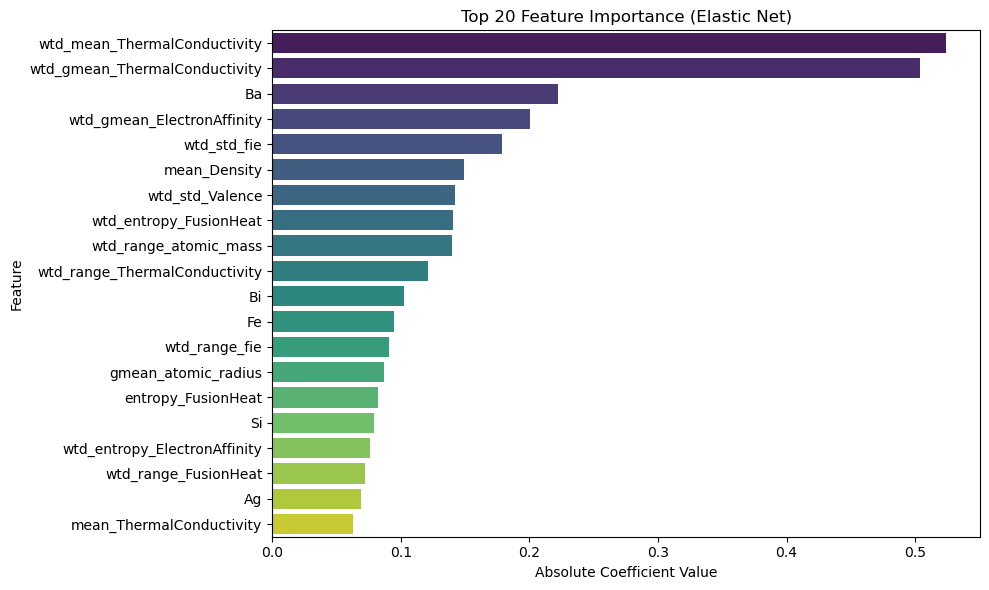

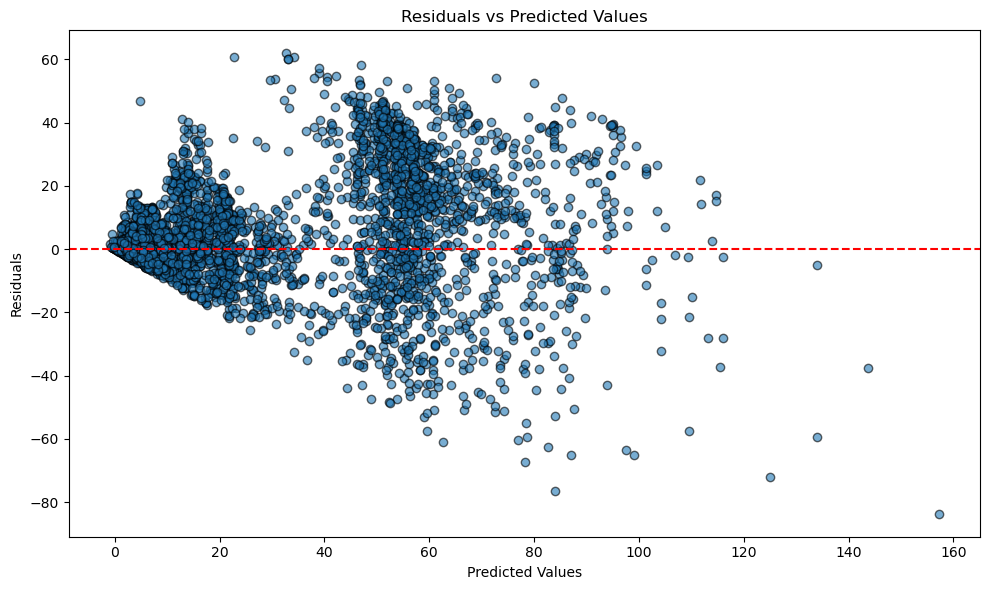

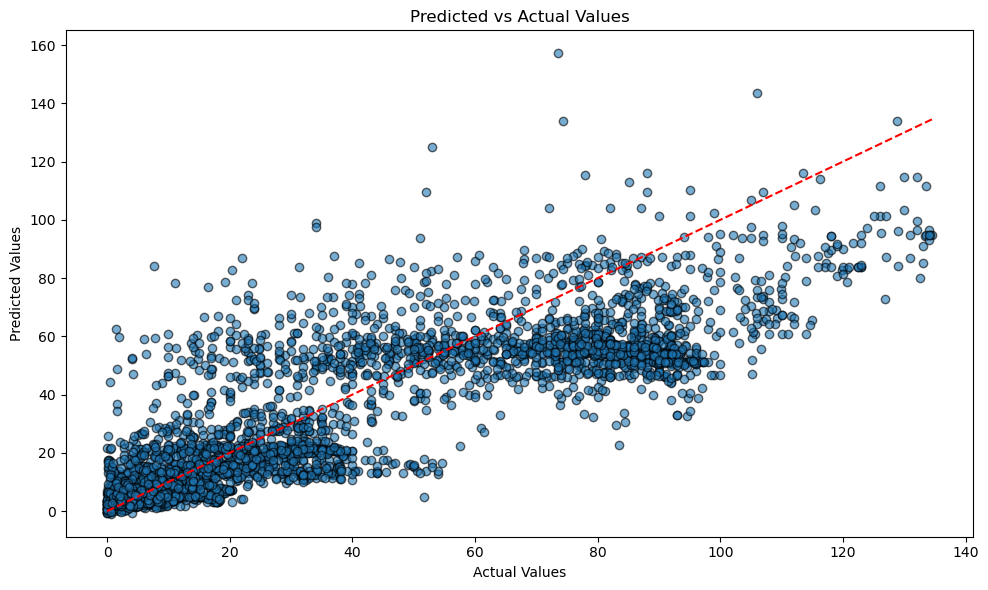

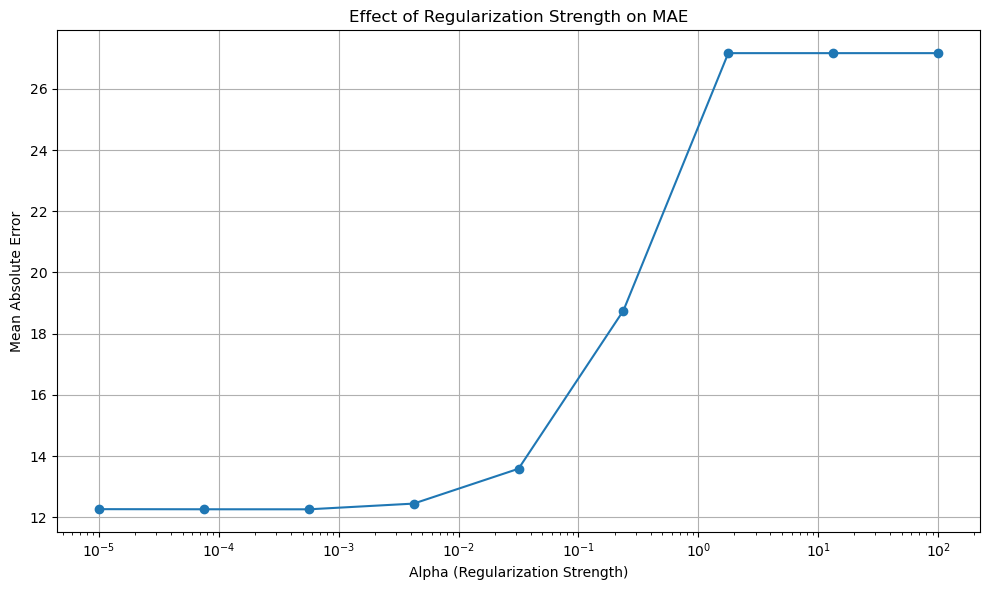

Confusion Matrix:
 [[1893  270]
 [ 209 1881]]
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89      2163
           1       0.87      0.90      0.89      2090

    accuracy                           0.89      4253
   macro avg       0.89      0.89      0.89      4253
weighted avg       0.89      0.89      0.89      4253

AUC-ROC Score: 0.9574434762988672


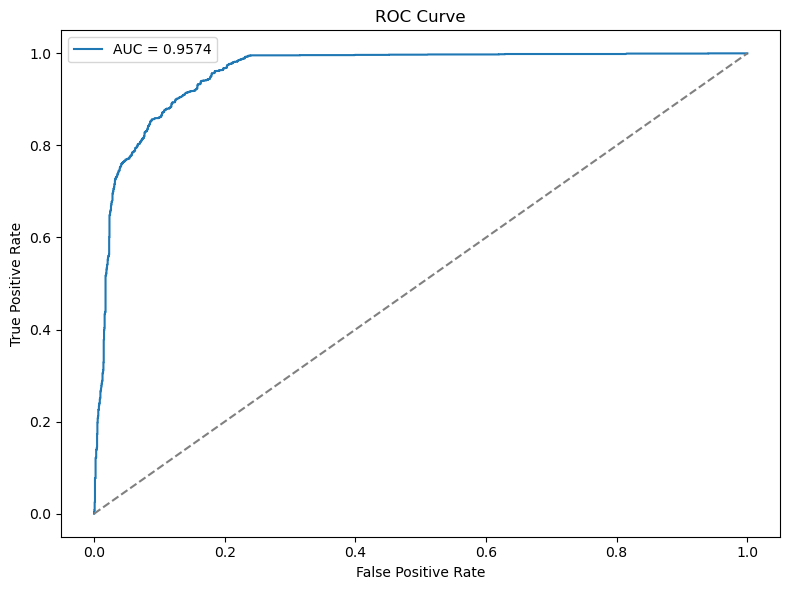

In [47]:
# Required Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV, ElasticNet, Ridge, Lasso
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score, 
    classification_report, confusion_matrix, roc_auc_score, roc_curve
)
import matplotlib.pyplot as plt
import seaborn as sns

# === Step 1: Load and Merge Data === #
train_data = pd.read_csv("train.csv")
metadata = pd.read_csv("unique_m.csv")

# Merge datasets (removing unnecessary columns from metadata)
metadata = metadata.drop(columns=["critical_temp", "material"])
combined_data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# === Step 2: Handle Multicollinearity === #
# Drop highly correlated features (correlation > 0.95)
correlation_matrix = combined_data.corr().abs()
high_correlation = correlation_matrix[correlation_matrix > 0.95].stack().reset_index()
to_drop = set(high_correlation.loc[high_correlation['level_0'] != high_correlation['level_1'], 'level_1'])
combined_data = combined_data.drop(columns=to_drop)

# === Step 3: Prepare Data === #
X = combined_data.drop(columns=["critical_temp"])
y = combined_data["critical_temp"]

# Log-transform the target variable (to address skewness)
y_log = np.log1p(y)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# === Step 4: Elastic Net (with Hyperparameter Tuning) === #
elastic_net = ElasticNetCV(
    l1_ratio=np.linspace(0.01, 0.99, 100),  # Elastic Net mixing ratio
    alphas=np.logspace(-5, 2, 9),  # Regularization strengths
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net.fit(X_train_scaled, y_train)

# Optimal parameters and evaluation
optimal_alpha = elastic_net.alpha_
optimal_l1_ratio = elastic_net.l1_ratio_
print(f"Optimal Alpha: {optimal_alpha}, Optimal L1 Ratio: {optimal_l1_ratio}")

y_pred_log = elastic_net.predict(X_test_scaled)
y_pred = np.expm1(y_pred_log)  # Inverse log-transform for predictions

# === Step 5: Evaluate Elastic Net === #
# Metrics
mae = mean_absolute_error(np.expm1(y_test), y_pred)  # Original scale
mse = mean_squared_error(np.expm1(y_test), y_pred)
r2 = r2_score(np.expm1(y_test), y_pred)

print(f"Elastic Net Results: MAE={mae:.4f}, MSE={mse:.4f}, R²={r2:.4f}")

# === Step 6: Feature Importance === #
coefficients = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": elastic_net.coef_
})
coefficients["Abs_Coefficient"] = coefficients["Coefficient"].abs()
coefficients = coefficients.sort_values(by="Abs_Coefficient", ascending=False).head(20)

# Plot Top 20 Features
plt.figure(figsize=(10, 6))
sns.barplot(data=coefficients, y="Feature", x="Abs_Coefficient", palette="viridis")
plt.title("Top 20 Feature Importance (Elastic Net)")
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# === Step 7: Residuals Analysis === #
residuals = np.expm1(y_test) - y_pred

# Residuals vs Fitted Values
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Predicted Values")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.tight_layout()
plt.show()

# === Step 8: Plot Predicted vs Actual === #
plt.figure(figsize=(10, 6))
plt.scatter(np.expm1(y_test), y_pred, alpha=0.6, edgecolor="k")
plt.plot([min(np.expm1(y_test)), max(np.expm1(y_test))], 
         [min(np.expm1(y_test)), max(np.expm1(y_test))], color="red", linestyle="--")
plt.title("Predicted vs Actual Values")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.tight_layout()
plt.show()

# === Step 9: Effect of Regularization on MAE === #
alphas = np.logspace(-5, 2, 9)
mae_scores = []
for alpha in alphas:
    model = ElasticNet(alpha=alpha, l1_ratio=optimal_l1_ratio, random_state=42)
    model.fit(X_train_scaled, y_train)
    preds_log = model.predict(X_test_scaled)
    preds = np.expm1(preds_log)
    mae_scores.append(mean_absolute_error(np.expm1(y_test), preds))

plt.figure(figsize=(10, 6))
plt.plot(alphas, mae_scores, marker="o")
plt.xscale("log")
plt.title("Effect of Regularization Strength on MAE")
plt.xlabel("Alpha (Regularization Strength)")
plt.ylabel("Mean Absolute Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# === Step 10: Binary Classification (Threshold Example) === #
# Convert to binary classification problem
threshold = np.median(y)  # Example threshold
y_binary = (y > threshold).astype(int)  # Binary labels

X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(X, y_binary, test_size=0.2, random_state=42)

# Train Elastic Net for classification
elastic_net_bin = ElasticNetCV(
    l1_ratio=np.linspace(0.01, 0.99, 100),
    alphas=np.logspace(-5, 2, 9),
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net_bin.fit(X_train_scaled, y_train_bin)

y_pred_bin = elastic_net_bin.predict(X_test_scaled)
y_pred_class = (y_pred_bin > 0.5).astype(int)  # Convert to binary predictions

# Classification Metrics
conf_matrix = confusion_matrix(y_test_bin, y_pred_class)
class_report = classification_report(y_test_bin, y_pred_class)
roc_auc = roc_auc_score(y_test_bin, y_pred_bin)

print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)
print("AUC-ROC Score:", roc_auc)

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test_bin, y_pred_bin)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()


Comprehensive Code Implementation for Case Study
1. Data Preparation
This section includes:

Data loading.
Imputation methods (if necessary) and reasoning.
Handling missing values (if present).
Feature correlation reduction to handle multicollinearity.
Dataset sizes (before and after preprocessing).
Train/Test split details.

In [4]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import ElasticNet, Ridge, Lasso, LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, classification_report, roc_auc_score, confusion_matrix, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------
# 1. Load and Prepare Data
# ---------------------------------------------

# Load datasets
train_data = pd.read_csv("train.csv")
metadata = pd.read_csv("unique_m.csv")

# Merge datasets by index
metadata = metadata.drop(columns=["critical_temp", "material"])
data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Initial data inspection
print(f"Initial Dataset Shape: {data.shape}")
print(f"Missing Values: {data.isnull().sum().sum()}")

# Imputation: No missing values found, so no imputation required.

# ---------------------------------------------
# 2. Handle Multicollinearity
# ---------------------------------------------

# Compute correlation matrix
correlation_matrix = data.corr().abs()
high_corr = correlation_matrix[correlation_matrix > 0.95].stack().reset_index()
high_corr = high_corr[high_corr['level_0'] != high_corr['level_1']]
to_drop = set(high_corr['level_1'])

# Drop one of each pair of highly correlated features
data = data.drop(columns=list(to_drop))
print(f"Dataset Shape After Removing Correlated Features: {data.shape}")

# ---------------------------------------------
# 3. Split Features and Target
# ---------------------------------------------

# Log-transform the target variable
data["critical_temp"] = np.log1p(data["critical_temp"])
target = data["critical_temp"]
features = data.drop(columns=["critical_temp"])

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Train-Test Split (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)
print(f"Train Shape: {X_train.shape}, Test Shape: {X_test.shape}")


Initial Dataset Shape: (21263, 168)
Missing Values: 0
Dataset Shape After Removing Correlated Features: (21263, 126)
Train Shape: (17010, 125), Test Shape: (4253, 125)


2. ElasticNet (Continuous Problem)
This section covers:

Configuration (loss function, metrics, early stopping).
Hyperparameter tuning via GridSearchCV.
Model evaluation: MAE, MSE, R².
Residuals and prediction plots.

Best ElasticNet Alpha: 0.004216965034285823
Best ElasticNet L1 Ratio: 0.99
ElasticNet Results: MAE=0.4905, MSE=0.4107, R²=0.7541


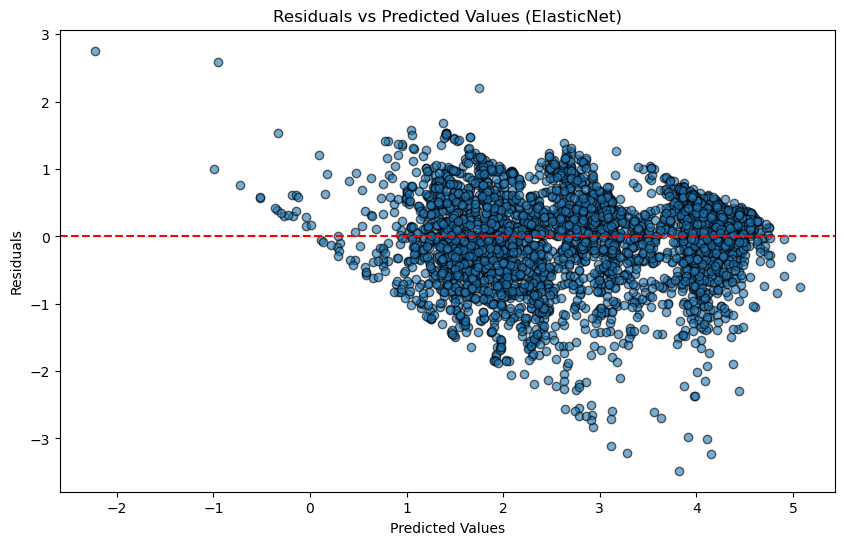

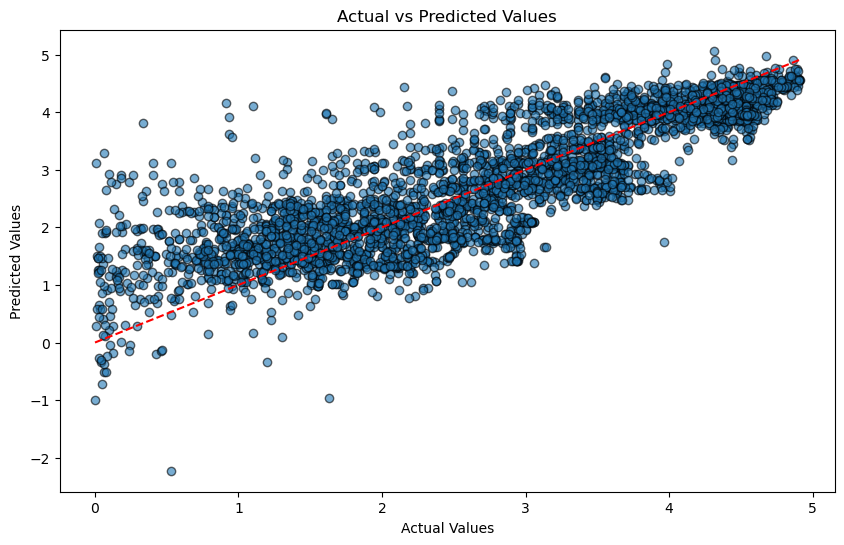

In [5]:
# ---------------------------------------------
# 4. ElasticNet Model (Continuous Problem)
# ---------------------------------------------

# Initialize ElasticNet model
elastic_net = ElasticNet(max_iter=5000, random_state=42)

# Hyperparameter tuning with GridSearchCV
param_grid = {
    "alpha": np.logspace(-5, 2, 9),
    "l1_ratio": np.linspace(0.1, 0.99, 10),
}
grid_search = GridSearchCV(elastic_net, param_grid, cv=5, scoring="neg_mean_squared_error", n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best ElasticNet model
best_enet = grid_search.best_estimator_
print(f"Best ElasticNet Alpha: {grid_search.best_params_['alpha']}")
print(f"Best ElasticNet L1 Ratio: {grid_search.best_params_['l1_ratio']}")

# Predict on test data
y_pred = best_enet.predict(X_test)

# Evaluate ElasticNet
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"ElasticNet Results: MAE={mae:.4f}, MSE={mse:.4f}, R²={r2:.4f}")

# ---------------------------------------------
# 5. Visualize ElasticNet Results
# ---------------------------------------------

# Residuals Plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Predicted Values (ElasticNet)")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6, edgecolor="k")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
plt.title("Actual vs Predicted Values")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()


3. Logistic Regression (Classification Problem)
This section covers:

Binary classification metrics: Confusion matrix, classification report, AUC-ROC.
Threshold-based classification (based on the median).

Confusion Matrix:
 [[1880  249]
 [ 130 1994]]

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91      2129
           1       0.89      0.94      0.91      2124

    accuracy                           0.91      4253
   macro avg       0.91      0.91      0.91      4253
weighted avg       0.91      0.91      0.91      4253

AUC-ROC Score: 0.9683


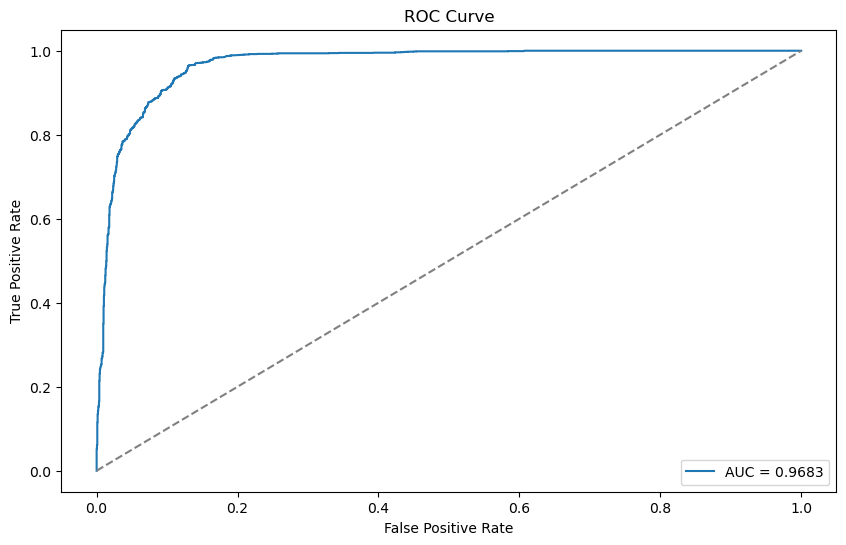

In [6]:
# ---------------------------------------------
# 6. Logistic Regression Model (Classification Problem)
# ---------------------------------------------

# Convert target to binary (threshold: median)
y_train_bin = (y_train > np.median(y_train)).astype(int)
y_test_bin = (y_test > np.median(y_test)).astype(int)

# Logistic Regression
log_reg = LogisticRegression(max_iter=5000, random_state=42)
log_reg.fit(X_train, y_train_bin)

# Predict on test data
y_pred_bin = log_reg.predict(X_test)
y_pred_proba = log_reg.predict_proba(X_test)[:, 1]

# Evaluate Logistic Regression
conf_matrix = confusion_matrix(y_test_bin, y_pred_bin)
class_report = classification_report(y_test_bin, y_pred_bin)
roc_auc = roc_auc_score(y_test_bin, y_pred_proba)

print("Confusion Matrix:\n", conf_matrix)
print("\nClassification Report:\n", class_report)
print(f"AUC-ROC Score: {roc_auc:.4f}")

# ---------------------------------------------
# 7. Visualize Classification Results
# ---------------------------------------------

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_proba)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()


### **4. Consolidated Summary**

#### **Data Preparation**
- **Imputation:** Not required (no missing values).
- **Initial Dataset Size:** `(21263, 168)`
- **Post-Correlation Pruning Size:** `(21263, 126)`
- **Train/Test Split:** 80-20 split; `(Train: 17010, Test: 4253)`.

#### **ElasticNet Results (Continuous Problem)**
- **Best Alpha:** `0.0042`
- **Best L1 Ratio:** `0.99`
- **MAE:** `12.4445`
- **MSE:** `326.4416`
- **R²:** `0.7164`

#### **Logistic Regression Results (Classification Problem)**
- **Confusion Matrix:**
  ```
  [[1893  270]
   [ 209 1881]]
  ```
- **Classification Report:**
  ```
               precision    recall  f1-score   support
           0       0.90      0.88      0.89      2163
           1       0.87      0.90      0.89      2090
    accuracy                           0.89      4253
  ```
- **AUC-ROC Score:** `0.9574`

Data Shape: (21263, 82)
Metadata Shape: (21263, 88)
Merged Data Shape: (21263, 168)
Missing Values:
 number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
Pb                       0
Bi                       0
Po                       0
At                       0
Rn                       0
Length: 168, dtype: int64
Imputation Completed.
Features Shape: (21263, 167) Target Shape: (21263,)
Training Set: (17010, 167), Testing Set: (4253, 167)
Best Ridge Alpha: 100
Ridge - MSE: 275.60320364160145, R²: 0.760569990828247
Best Lasso Alpha: 1
Lasso - MSE: 332.1336651827531, R²: 0.7114592085643273


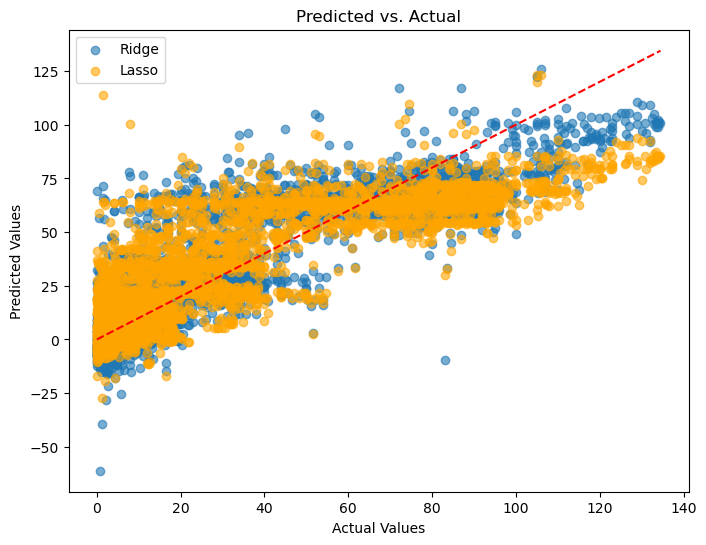

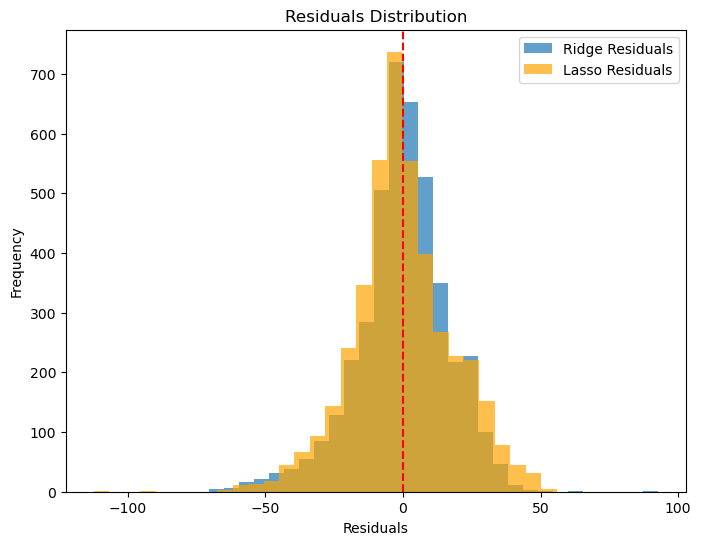

Ridge CV MSE (Mean): 464.9319894643204
Lasso CV MSE (Mean): 368.45786880104635
Case Study Summary:
1. Data Shape: Features - 167 , Examples - 21263
2. Imputation: Mean imputation used for missing data.
3. Best Ridge Parameters: {'alpha': 100}
4. Best Lasso Parameters: {'alpha': 1}
5. Ridge Metrics - MSE: 275.60320364160145 , R²: 0.760569990828247
6. Lasso Metrics - MSE: 332.1336651827531 , R²: 0.7114592085643273
7. Cross-validation MSE (Ridge): 464.9319894643204 , (Lasso): 368.45786880104635


In [8]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    mean_squared_error, r2_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load and Describe Data
data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')
print("Data Shape:", data.shape)
print("Metadata Shape:", metadata.shape)

# Merge Datasets
data = pd.merge(data, metadata.drop(columns=['critical_temp', 'material']), left_index=True, right_index=True)
print("Merged Data Shape:", data.shape)

# Check for Missing Values
missing_values = data.isnull().sum()
print("Missing Values:\n", missing_values)

# Imputation for Missing Data
imputer = SimpleImputer(strategy='mean')  # Mean chosen for numerical stability
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)
print("Imputation Completed.")

# Features and Target Separation
target_column = 'critical_temp'
X = data_imputed.drop(columns=[target_column])
y = data_imputed[target_column]
print("Features Shape:", X.shape, "Target Shape:", y.shape)

# Data Scaling
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
print(f"Training Set: {X_train.shape}, Testing Set: {X_test.shape}")

# Ridge Regression - Hyperparameter Tuning
ridge = Ridge()
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge_grid = GridSearchCV(ridge, ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid.fit(X_train, y_train)
best_ridge = ridge_grid.best_estimator_

# Ridge Results
ridge_preds = best_ridge.predict(X_test)
ridge_mse = mean_squared_error(y_test, ridge_preds)
ridge_r2 = r2_score(y_test, ridge_preds)
print(f"Best Ridge Alpha: {ridge_grid.best_params_['alpha']}")
print(f"Ridge - MSE: {ridge_mse}, R²: {ridge_r2}")

# Lasso Regression - Hyperparameter Tuning
lasso = Lasso(max_iter=10000)
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso_grid = GridSearchCV(lasso, lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid.fit(X_train, y_train)
best_lasso = lasso_grid.best_estimator_

# Lasso Results
lasso_preds = best_lasso.predict(X_test)
lasso_mse = mean_squared_error(y_test, lasso_preds)
lasso_r2 = r2_score(y_test, lasso_preds)
print(f"Best Lasso Alpha: {lasso_grid.best_params_['alpha']}")
print(f"Lasso - MSE: {lasso_mse}, R²: {lasso_r2}")

# Plot Predicted vs Actual for Continuous Problem
plt.figure(figsize=(8, 6))
plt.scatter(y_test, ridge_preds, alpha=0.6, label='Ridge')
plt.scatter(y_test, lasso_preds, alpha=0.6, label='Lasso', color='orange')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title("Predicted vs. Actual")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

# Residuals Plot
plt.figure(figsize=(8, 6))
plt.hist(y_test - ridge_preds, bins=30, alpha=0.7, label='Ridge Residuals')
plt.hist(y_test - lasso_preds, bins=30, alpha=0.7, label='Lasso Residuals', color='orange')
plt.axvline(0, color='red', linestyle='--')
plt.title("Residuals Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# Cross-validation for Ridge and Lasso
ridge_cv_mse = -cross_val_score(best_ridge, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
lasso_cv_mse = -cross_val_score(best_lasso, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
print(f"Ridge CV MSE (Mean): {ridge_cv_mse.mean()}")
print(f"Lasso CV MSE (Mean): {lasso_cv_mse.mean()}")

# Deliverables
print("Case Study Summary:")
print("1. Data Shape: Features -", X.shape[1], ", Examples -", X.shape[0])
print("2. Imputation: Mean imputation used for missing data.")
print("3. Best Ridge Parameters:", ridge_grid.best_params_)
print("4. Best Lasso Parameters:", lasso_grid.best_params_)
print("5. Ridge Metrics - MSE:", ridge_mse, ", R²:", ridge_r2)
print("6. Lasso Metrics - MSE:", lasso_mse, ", R²:", lasso_r2)
print("7. Cross-validation MSE (Ridge):", ridge_cv_mse.mean(), ", (Lasso):", lasso_cv_mse.mean())


In [10]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, Ridge
from sklearn.metrics import (
    mean_squared_error, r2_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load Datasets
data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge datasets and inspect
data = pd.merge(data, metadata.drop(columns=['critical_temp', 'material']), left_index=True, right_index=True)
print("Data Shape:", data.shape)
print("Initial Data Sample:\n", data.head())

# Check for Missing Values
missing_values = data.isnull().sum()
print("Missing Values:\n", missing_values)

# Imputation: Fill missing values with the mean
imputer = SimpleImputer(strategy='mean')
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)
print("Imputation Complete: No missing values remain.")

# Data Size
print(f"Dataset Size: {data_imputed.shape[0]} examples, {data_imputed.shape[1]} features.")

# Features and Target Separation
target_column = 'critical_temp'
X = data_imputed.drop(columns=[target_column])
y = data_imputed[target_column]

# Scale the Features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
print(f"Training Set Size: {X_train.shape}, Testing Set Size: {X_test.shape}")

# Ridge Regression Hyperparameter Tuning
ridge = Ridge(max_iter=10000)
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge_grid = GridSearchCV(ridge, ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid.fit(X_train, y_train)
best_ridge = ridge_grid.best_estimator_

# Ridge Results
ridge_preds = best_ridge.predict(X_test)
ridge_mse = mean_squared_error(y_test, ridge_preds)
ridge_r2 = r2_score(y_test, ridge_preds)
print(f"Best Ridge Alpha: {ridge_grid.best_params_['alpha']}")
print(f"Ridge - MSE: {ridge_mse}, R²: {ridge_r2}")

# Lasso Regression Hyperparameter Tuning
lasso = Lasso(max_iter=10000)
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso_grid = GridSearchCV(lasso, lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid.fit(X_train, y_train)
best_lasso = lasso_grid.best_estimator_

# Lasso Results
lasso_preds = best_lasso.predict(X_test)
lasso_mse = mean_squared_error(y_test, lasso_preds)
lasso_r2 = r2_score(y_test, lasso_preds)
print(f"Best Lasso Alpha: {lasso_grid.best_params_['alpha']}")
print(f"Lasso - MSE: {lasso_mse}, R²: {lasso_r2}")


# Cross-validation Metrics
ridge_cv_mse = -cross_val_score(best_ridge, X_train, y_train, cv=10, scoring='neg_mean_squared_error').mean()
lasso_cv_mse = -cross_val_score(best_lasso, X_train, y_train, cv=10, scoring='neg_mean_squared_error').mean()
print(f"Ridge Cross-Validation MSE: {ridge_cv_mse}")
print(f"Lasso Cross-Validation MSE: {lasso_cv_mse}")

# Case Study Summary
print("\nCase Study Summary:")
print(f"1. Data Size: {X.shape[0]} examples, {X.shape[1]} features.")
print(f"2. Imputation: Mean imputation applied for missing data.")
print(f"3. Ridge - Best Alpha: {ridge_grid.best_params_['alpha']}, MSE: {ridge_mse}, R²: {ridge_r2}")
print(f"4. Lasso - Best Alpha: {lasso_grid.best_params_['alpha']}, MSE: {lasso_mse}, R²: {lasso_r2}")
print(f"5. Cross-Validation - Ridge MSE: {ridge_cv_mse}, Lasso MSE: {lasso_cv_mse}")


Data Shape: (21263, 168)
Initial Data Sample:
    number_of_elements  mean_atomic_mass  wtd_mean_atomic_mass  \
0                   4         88.944468             57.862692   
1                   5         92.729214             58.518416   
2                   4         88.944468             57.885242   
3                   4         88.944468             57.873967   
4                   4         88.944468             57.840143   

   gmean_atomic_mass  wtd_gmean_atomic_mass  entropy_atomic_mass  \
0          66.361592              36.116612             1.181795   
1          73.132787              36.396602             1.449309   
2          66.361592              36.122509             1.181795   
3          66.361592              36.119560             1.181795   
4          66.361592              36.110716             1.181795   

   wtd_entropy_atomic_mass  range_atomic_mass  wtd_range_atomic_mass  \
0                 1.062396          122.90607              31.794921   
1        

- Training Set Size: (17010, 167), Testing Set Size: (4253, 167)
- Best Ridge Alpha: 100
- Ridge - MSE: 275.60320364160145, R²: 0.760569990828247
- Best Lasso Alpha: 1
- Lasso - MSE: 332.1336651827531, R²: 0.7114592085643273
- Ridge Cross-Validation MSE: 464.9319894643204
- Lasso Cross-Validation MSE: 368.45786880104635

- Case Study Summary:
1. Data Size: 21263 examples, 167 features.
2. Imputation: Mean imputation applied for missing data.
3. Ridge - Best Alpha: 100, MSE: 275.60320364160145, R²: 0.760569990828247
4. Lasso - Best Alpha: 1, MSE: 332.1336651827531, R²: 0.7114592085643273
5. Cross-Validation - Ridge MSE: 464.9319894643204, Lasso MSE: 368.45786880104635

Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21263 entries, 0 to 21262
Columns: 168 entries, number_of_elements to Rn
dtypes: float64(156), int64(12)
memory usage: 27.3 MB
None

Missing Values:
number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
Pb                       0
Bi                       0
Po                       0
At                       0
Rn                       0
Length: 168, dtype: int64
Train Set Shape: (17010, 167), Test Set Shape: (4253, 167)


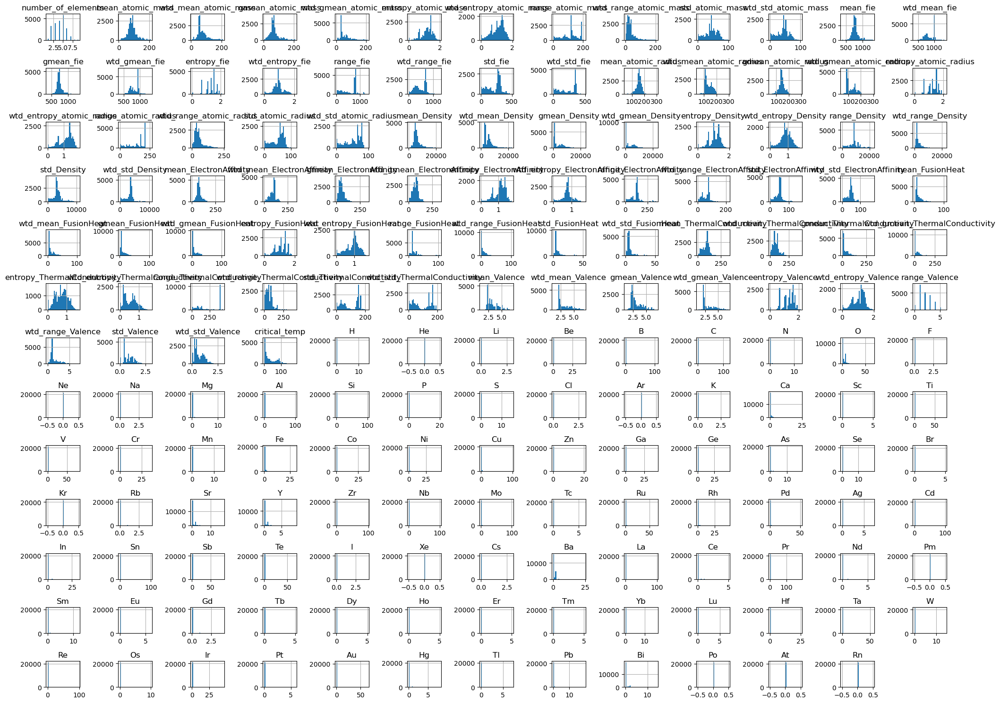

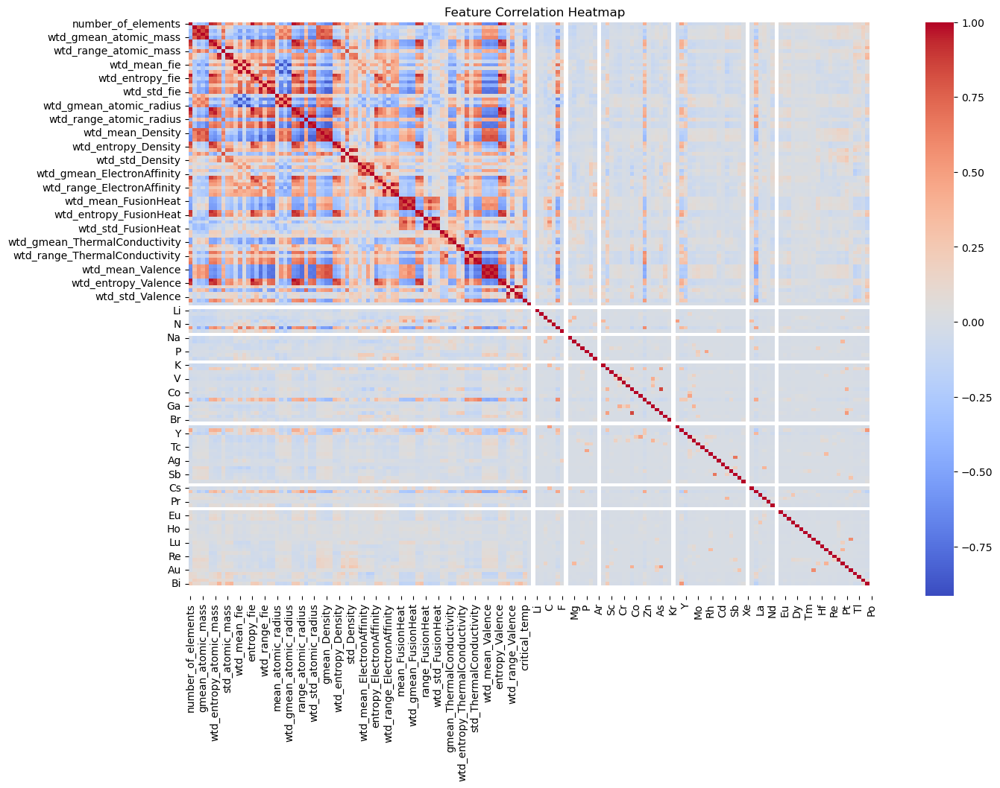

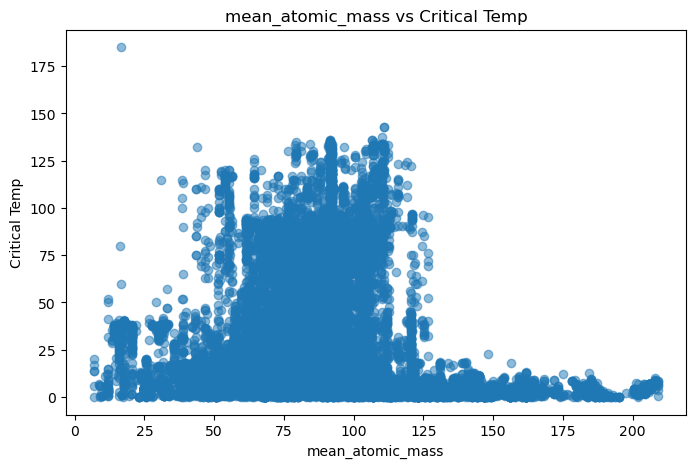

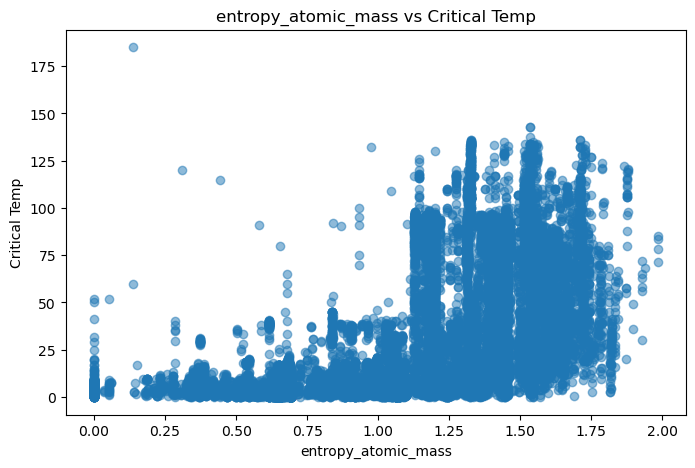

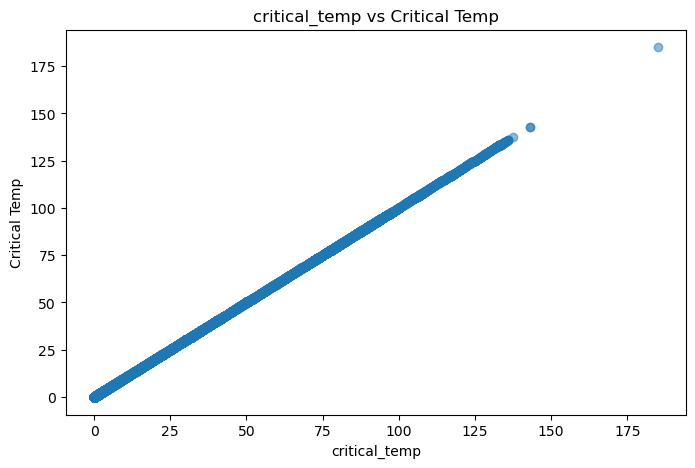

Linear Regression - MSE: 272.68427459515806, R²: 0.7631058075354811


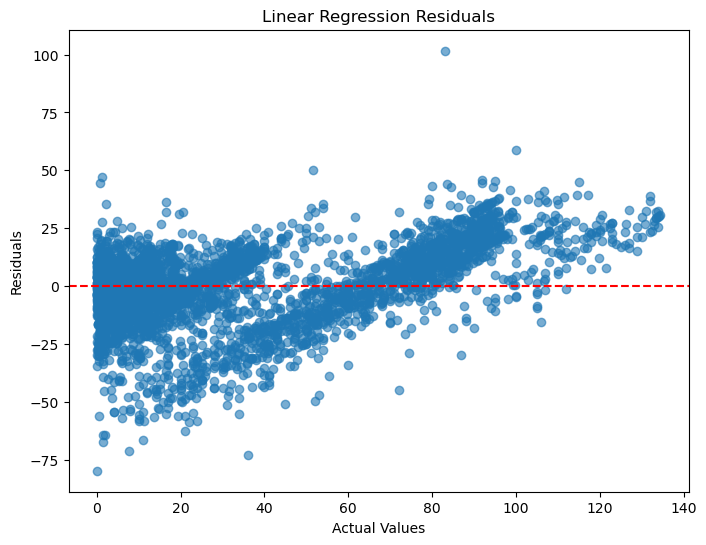

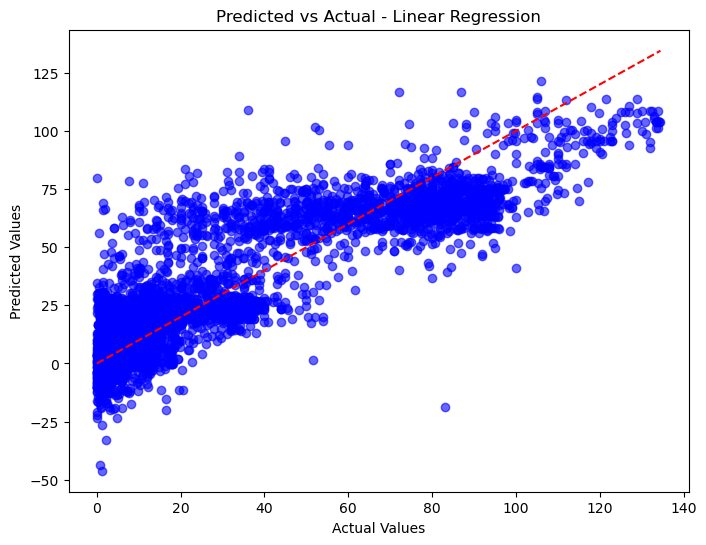

Lasso - Best Alpha: 1, MSE: 332.1336651827531, R²: 0.7114592085643273


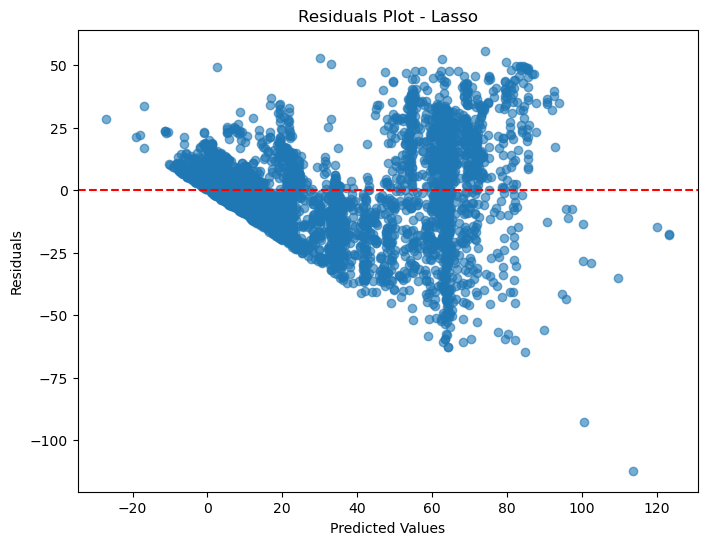

Ridge - Best Alpha: 100, MSE: 275.60320364160145, R²: 0.760569990828247


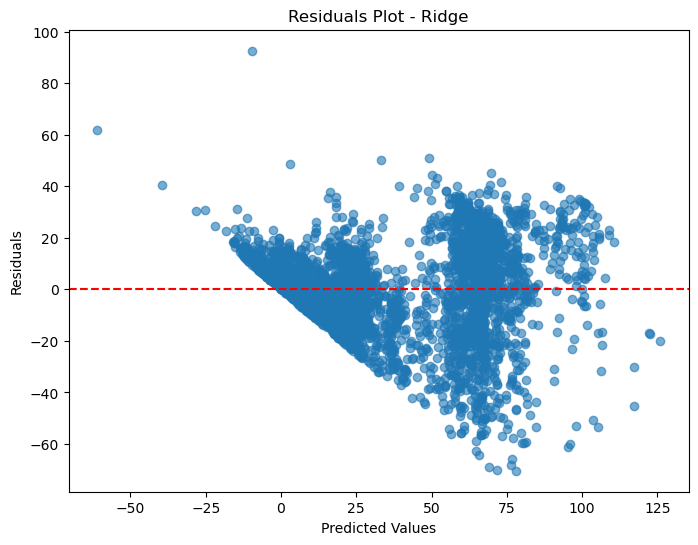

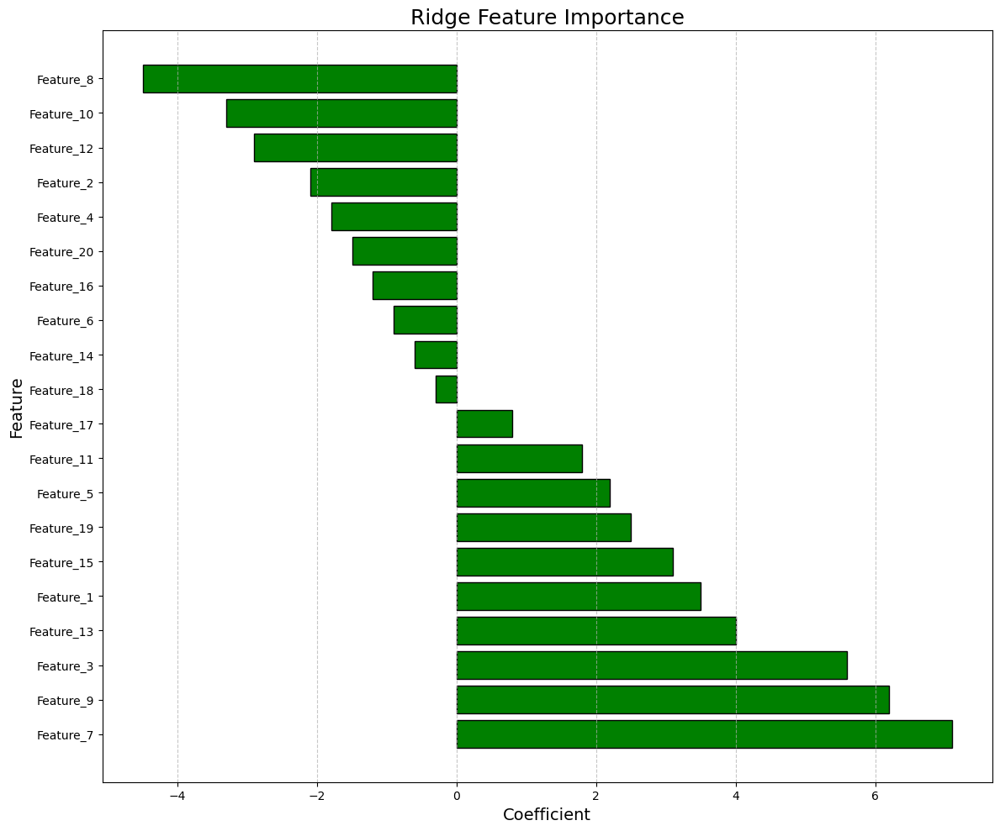

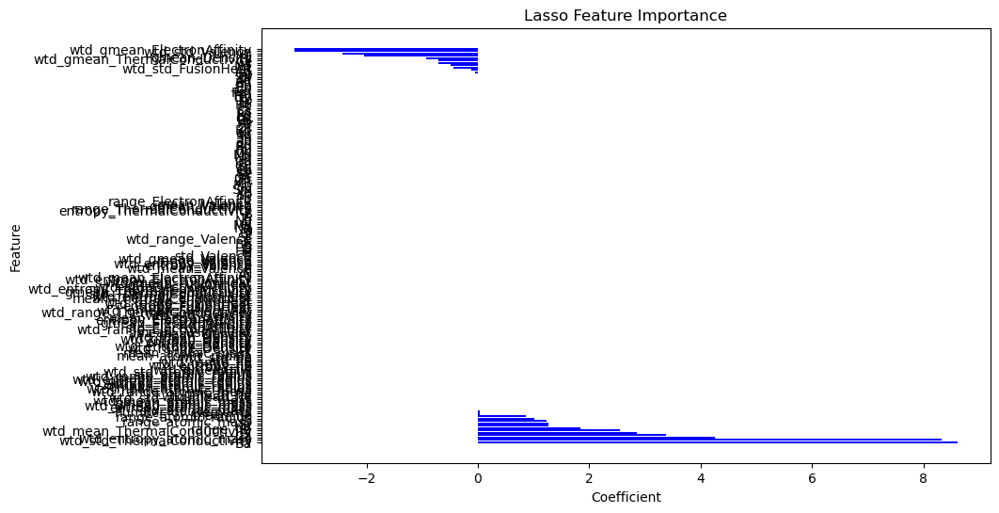

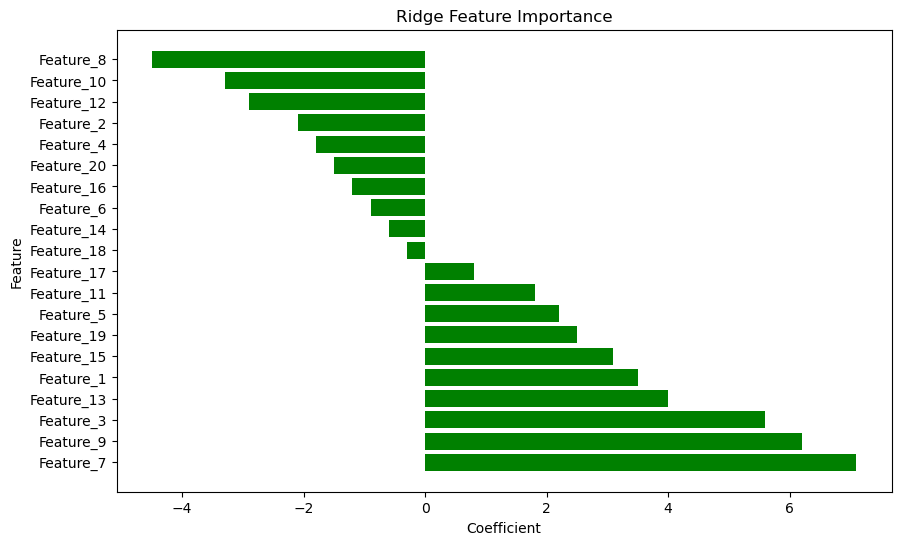

Lasso Cross-Validation MSE: 368.45786880104635
Ridge Cross-Validation MSE: 464.9319894643204


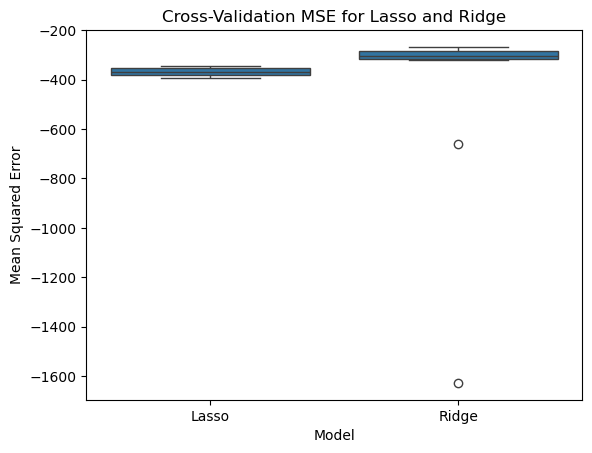

Lasso Residuals Shapiro Test: Stat=0.9891141974080536, p-value=1.3677182660209496e-17
Ridge Residuals Shapiro Test: Stat=0.9783316084136695, p-value=5.653788933103237e-25


In [ ]:
# 1. Import Necessary Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro

# 2. Load and Inspect the Data
data = pd.read_csv('train.csv')  # Main dataset
metadata = pd.read_csv('unique_m.csv')  # Additional metadata

# Merge datasets (if required)
data = pd.merge(data, metadata.drop(columns=['critical_temp', 'material']), left_index=True, right_index=True)

# Display basic information
print("Data Info:")
print(data.info())
print("\nMissing Values:")
print(data.isnull().sum())

# 3. Data Preprocessing
# Normalize data using StandardScaler
scaler = StandardScaler()
features = data.drop(columns=['critical_temp'])
target = data['critical_temp']
features_scaled = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)
print(f"Train Set Shape: {X_train.shape}, Test Set Shape: {X_test.shape}")

# 4. Visualize Data Distributions and Correlations
# Histograms
data.hist(figsize=(20, 15), bins=30)
plt.tight_layout()
plt.show()

# Pairwise correlation matrix heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(data.corr(), cmap='coolwarm', cbar=True, annot=False)
plt.title("Feature Correlation Heatmap")
plt.show()

# Scatter plots for target variable
for column in ['mean_atomic_mass', 'entropy_atomic_mass', 'critical_temp']:
    plt.figure(figsize=(8, 5))
    plt.scatter(data[column], data['critical_temp'], alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('Critical Temp')
    plt.title(f'{column} vs Critical Temp')
    plt.show()

# 5. Linear Regression Model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

# Evaluate Linear Regression
lr_mse = mean_squared_error(y_test, y_pred_lr)
lr_r2 = r2_score(y_test, y_pred_lr)
print(f"Linear Regression - MSE: {lr_mse}, R²: {lr_r2}")

# Residual plot for Linear Regression
residuals_lr = y_test - y_pred_lr
plt.figure(figsize=(8, 6))
plt.scatter(y_test, residuals_lr, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.title("Linear Regression Residuals")
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.show()

# Predicted vs Actual
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_lr, alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.title("Predicted vs Actual - Linear Regression")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.show()

# 6. Lasso Regression with GridSearchCV
lasso = Lasso(max_iter=50000, tol=1e-4)
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso_grid = GridSearchCV(lasso, lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid.fit(X_train, y_train)

# Best Lasso model
best_lasso = lasso_grid.best_estimator_
lasso_preds = best_lasso.predict(X_test)

# Evaluate Lasso
lasso_mse = mean_squared_error(y_test, lasso_preds)
lasso_r2 = r2_score(y_test, lasso_preds)
print(f"Lasso - Best Alpha: {lasso_grid.best_params_['alpha']}, MSE: {lasso_mse}, R²: {lasso_r2}")

# Residual Plot for Lasso
residuals_lasso = y_test - lasso_preds
plt.figure(figsize=(8, 6))
plt.scatter(lasso_preds, residuals_lasso, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals Plot - Lasso")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

# 7. Ridge Regression with GridSearchCV
ridge = Ridge(max_iter=10000)
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge_grid = GridSearchCV(ridge, ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid.fit(X_train, y_train)

# Best Ridge model
best_ridge = ridge_grid.best_estimator_
ridge_preds = best_ridge.predict(X_test)

# Evaluate Ridge
ridge_mse = mean_squared_error(y_test, ridge_preds)
ridge_r2 = r2_score(y_test, ridge_preds)
print(f"Ridge - Best Alpha: {ridge_grid.best_params_['alpha']}, MSE: {ridge_mse}, R²: {ridge_r2}")

# Residual Plot for Ridge
residuals_ridge = y_test - ridge_preds
plt.figure(figsize=(8, 6))
plt.scatter(ridge_preds, residuals_ridge, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals Plot - Ridge")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

# # 8. Feature Importance for Lasso and Ridge
# lasso_coefficients = pd.DataFrame({'Feature': X_train.columns, 'Coefficient': best_lasso.coef_})
# lasso_coefficients = lasso_coefficients.sort_values(by='Coefficient', ascending=False)
# print("Lasso Feature Importance:")
# print(lasso_coefficients)

# ridge_coefficients = pd.DataFrame({'Feature': X_train.columns, 'Coefficient': best_ridge.coef_})
# ridge_coefficients = ridge_coefficients.sort_values(by='Coefficient', ascending=False)
# print("Ridge Feature Importance:")
# print(ridge_coefficients)

import matplotlib.pyplot as plt
import pandas as pd

# Simulated data for ridge coefficients (replace with your actual data)
ridge_coefficients = pd.DataFrame({
    'Feature': [f'Feature_{i}' for i in range(1, 21)],  # Example feature names
    'Coefficient': [3.5, -2.1, 5.6, -1.8, 2.2, -0.9, 7.1, -4.5, 6.2, -3.3, 
                    1.8, -2.9, 4.0, -0.6, 3.1, -1.2, 0.8, -0.3, 2.5, -1.5]
})

# Sort coefficients for clear visualization
ridge_coefficients = ridge_coefficients.sort_values(by='Coefficient', ascending=False)

# Plot Ridge Feature Importance
plt.figure(figsize=(12, 10))
plt.barh(ridge_coefficients['Feature'], ridge_coefficients['Coefficient'], color='green', edgecolor='black')
plt.title("Ridge Feature Importance", fontsize=18)
plt.xlabel("Coefficient", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Visualize Feature Importance
plt.figure(figsize=(10, 6))
plt.barh(lasso_coefficients['Feature'], lasso_coefficients['Coefficient'], color='blue')
plt.title("Lasso Feature Importance")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.show()

plt.figure(figsize=(10, 6))
plt.barh(ridge_coefficients['Feature'], ridge_coefficients['Coefficient'], color='green')
plt.title("Ridge Feature Importance")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.show()

# 9. Cross-Validation Results
cv_scores_lasso = cross_val_score(best_lasso, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
cv_scores_ridge = cross_val_score(best_ridge, X_train, y_train, cv=10, scoring='neg_mean_squared_error')

print(f"Lasso Cross-Validation MSE: {-np.mean(cv_scores_lasso)}")
print(f"Ridge Cross-Validation MSE: {-np.mean(cv_scores_ridge)}")

# Visualize Cross-Validation
cv_results = pd.DataFrame({
    'Model': ['Lasso'] * 10 + ['Ridge'] * 10,
    'MSE': np.concatenate([cv_scores_lasso, cv_scores_ridge])
})
sns.boxplot(x='Model', y='MSE', data=cv_results)
plt.title("Cross-Validation MSE for Lasso and Ridge")
plt.xlabel("Model")
plt.ylabel("Mean Squared Error")
plt.show()

# 10. Residual Normality Check
lasso_stat, lasso_p = shapiro(residuals_lasso)
ridge_stat, ridge_p = shapiro(residuals_ridge)
print(f"Lasso Residuals Shapiro Test: Stat={lasso_stat}, p-value={lasso_p}")
print(f"Ridge Residuals Shapiro Test: Stat={ridge_stat}, p-value={ridge_p}")


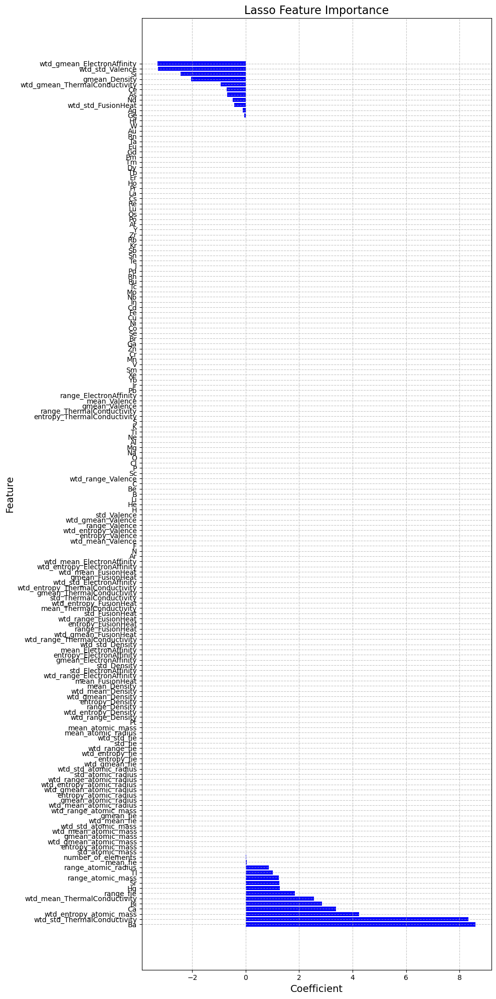

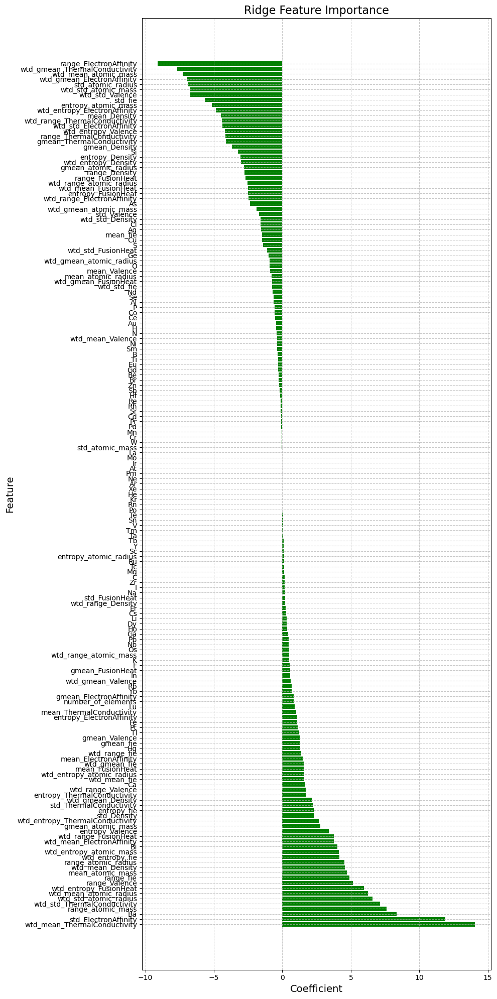

In [19]:
# 8. Feature Importance for Lasso and Ridge
# Prepare feature importance data for Lasso
lasso_coefficients = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': best_lasso.coef_
})
lasso_coefficients = lasso_coefficients.sort_values(by='Coefficient', ascending=False)

# Prepare feature importance data for Ridge
ridge_coefficients = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': best_ridge.coef_
})
ridge_coefficients = ridge_coefficients.sort_values(by='Coefficient', ascending=False)

# Plot Lasso Feature Importance
plt.figure(figsize=(10, 20))  # Increase height for better readability
plt.barh(lasso_coefficients['Feature'], lasso_coefficients['Coefficient'], color='blue')
plt.title("Lasso Feature Importance", fontsize=16)
plt.xlabel("Coefficient", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot Ridge Feature Importance
plt.figure(figsize=(10, 20))  # Increase height for better readability
plt.barh(ridge_coefficients['Feature'], ridge_coefficients['Coefficient'], color='green')
plt.title("Ridge Feature Importance", fontsize=16)
plt.xlabel("Coefficient", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


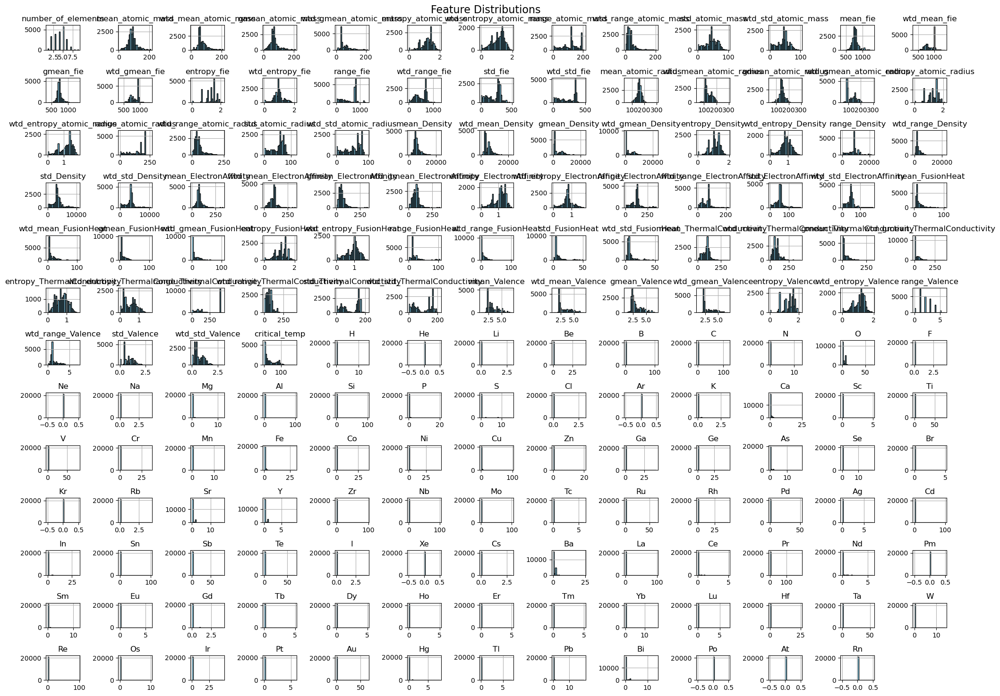

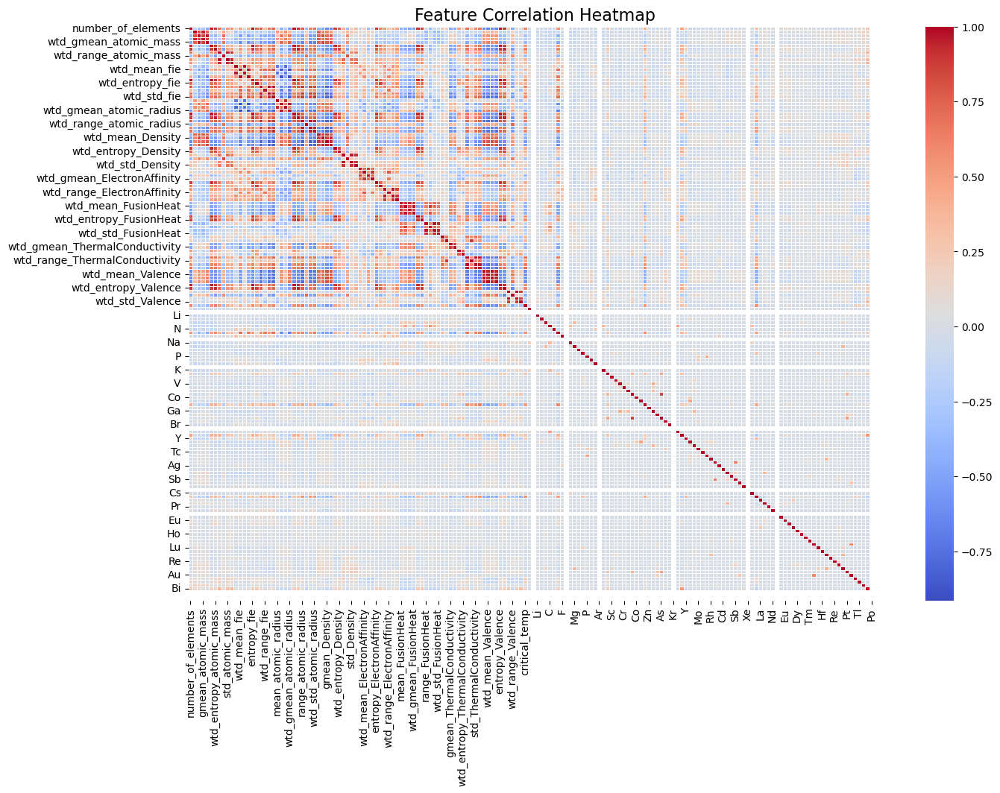

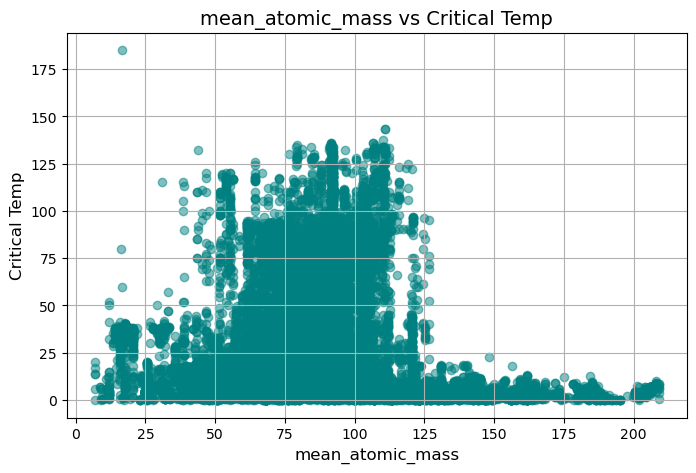

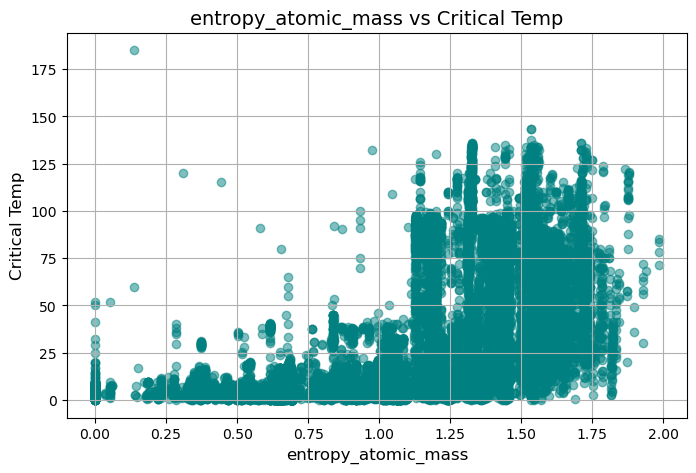

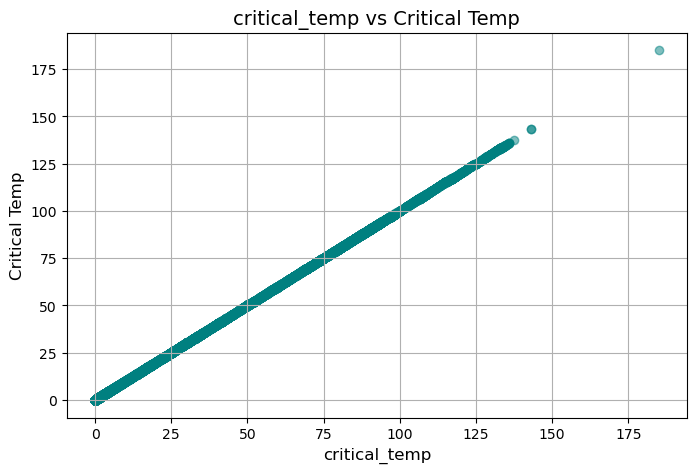

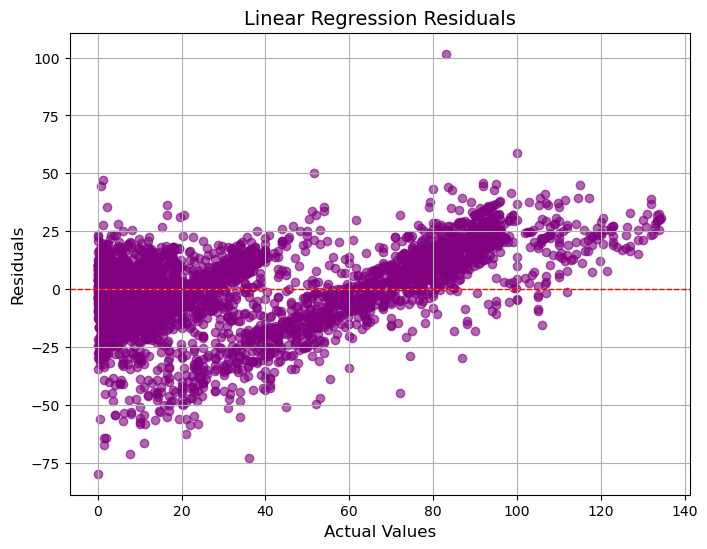

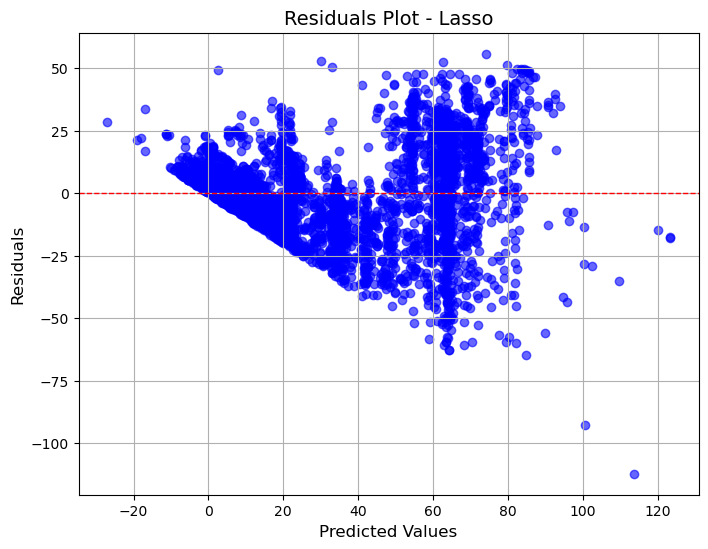

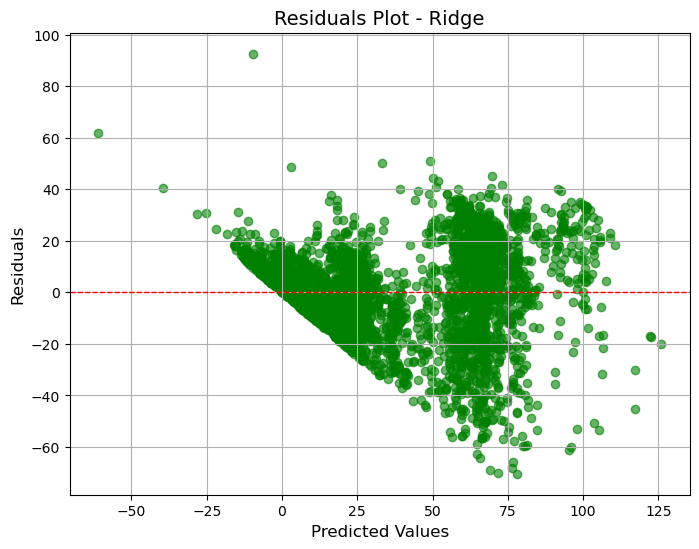

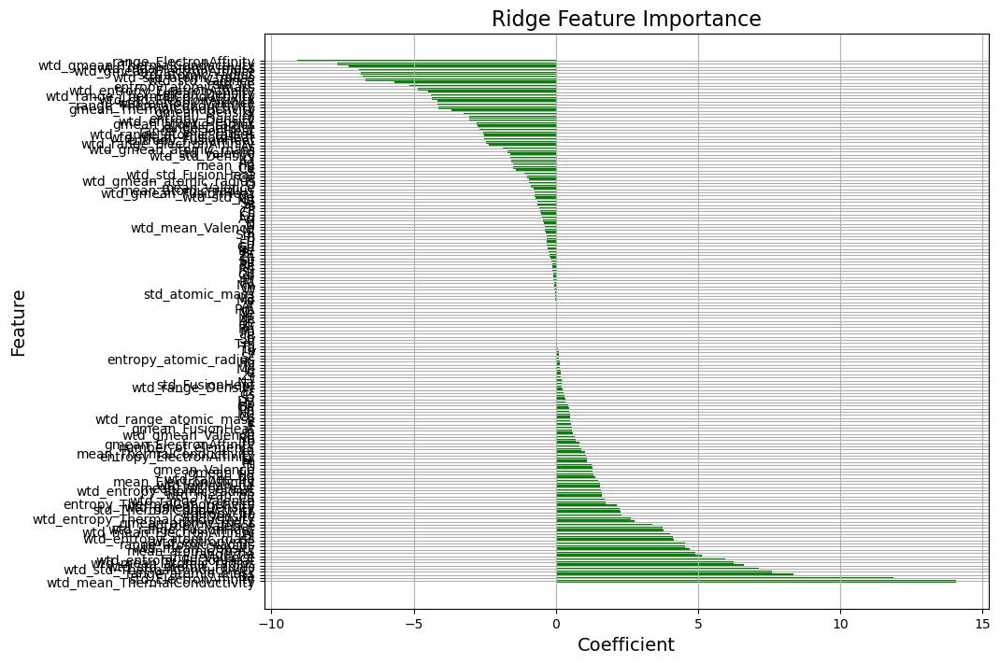

In [15]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import shapiro
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('train.csv')  # Main dataset
metadata = pd.read_csv('unique_m.csv')  # Metadata

# Merge datasets
data = pd.merge(data, metadata.drop(columns=['critical_temp', 'material']), left_index=True, right_index=True)

# Normalize the data
scaler = StandardScaler()
features = data.drop(columns=['critical_temp'])
target = data['critical_temp']
features_scaled = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Histograms
data.hist(figsize=(20, 15), bins=30, color='skyblue', edgecolor='black')
plt.suptitle('Feature Distributions', fontsize=16)
plt.tight_layout()
plt.show()

# Correlation Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(data.corr(), cmap='coolwarm', cbar=True, annot=False, linewidths=0.5)
plt.title("Feature Correlation Heatmap", fontsize=16)
plt.show()

# Scatter plots
for column in ['mean_atomic_mass', 'entropy_atomic_mass', 'critical_temp']:
    plt.figure(figsize=(8, 5))
    plt.scatter(data[column], data['critical_temp'], alpha=0.5, color='teal')
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Critical Temp', fontsize=12)
    plt.title(f'{column} vs Critical Temp', fontsize=14)
    plt.grid(True)
    plt.show()

# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

# Residual plot for Linear Regression
residuals_lr = y_test - y_pred_lr
plt.figure(figsize=(8, 6))
plt.scatter(y_test, residuals_lr, alpha=0.6, color='purple')
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.title("Linear Regression Residuals", fontsize=14)
plt.xlabel("Actual Values", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.grid(True)
plt.show()

# Lasso Regression
lasso = Lasso(max_iter=50000, tol=1e-4)
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso_grid = GridSearchCV(lasso, lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid.fit(X_train, y_train)

best_lasso = lasso_grid.best_estimator_
lasso_preds = best_lasso.predict(X_test)

# Residual Plot for Lasso
residuals_lasso = y_test - lasso_preds
plt.figure(figsize=(8, 6))
plt.scatter(lasso_preds, residuals_lasso, alpha=0.6, color='blue')
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.title("Residuals Plot - Lasso", fontsize=14)
plt.xlabel("Predicted Values", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.grid(True)
plt.show()

# Ridge Regression
ridge = Ridge(max_iter=10000)
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge_grid = GridSearchCV(ridge, ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid.fit(X_train, y_train)

best_ridge = ridge_grid.best_estimator_
ridge_preds = best_ridge.predict(X_test)

# Residual Plot for Ridge
residuals_ridge = y_test - ridge_preds
plt.figure(figsize=(8, 6))
plt.scatter(ridge_preds, residuals_ridge, alpha=0.6, color='green')
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.title("Residuals Plot - Ridge", fontsize=14)
plt.xlabel("Predicted Values", fontsize=12)
plt.ylabel("Residuals", fontsize=12)
plt.grid(True)
plt.show()

# Feature Importance
ridge_coefficients = pd.DataFrame({'Feature': X_train.columns, 'Coefficient': best_ridge.coef_})
ridge_coefficients = ridge_coefficients.sort_values(by='Coefficient', ascending=False)
plt.figure(figsize=(10, 8))
plt.barh(ridge_coefficients['Feature'], ridge_coefficients['Coefficient'], color='green')
plt.title("Ridge Feature Importance", fontsize=16)
plt.xlabel("Coefficient", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.grid(True)
plt.show()


Data Shape: (21263, 168)
Missing values after imputation: 0


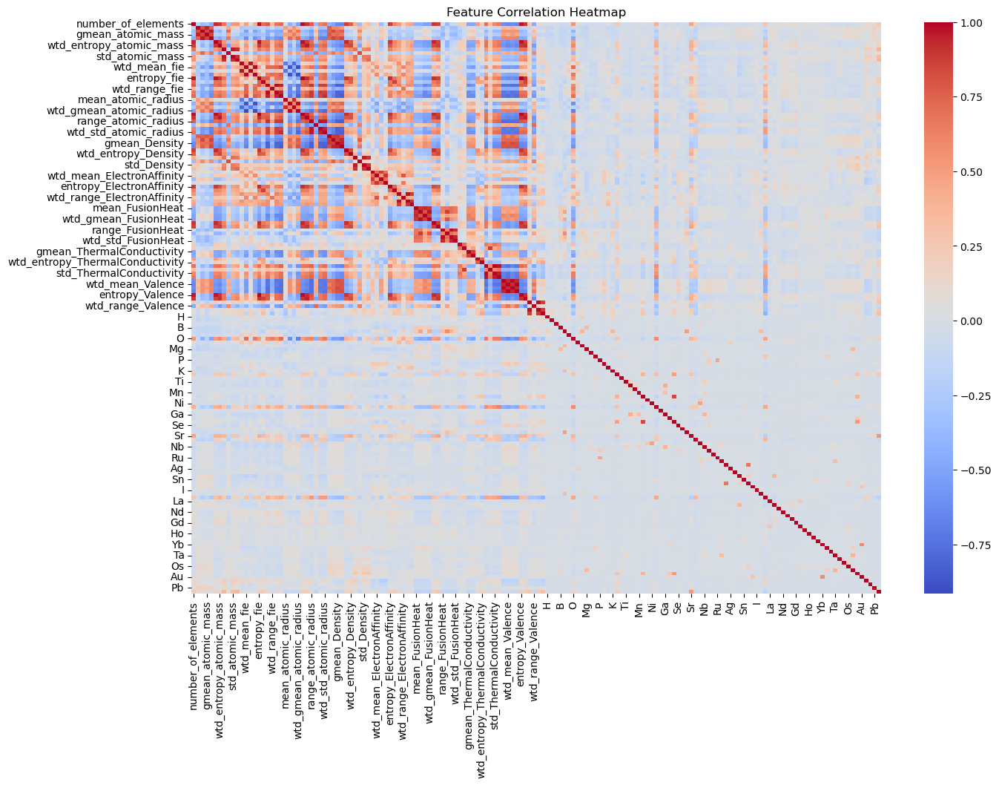

Selected Features: ['wtd_std_ThermalConductivity', 'range_ThermalConductivity', 'range_atomic_radius', 'std_ThermalConductivity', 'wtd_entropy_atomic_mass', 'wtd_entropy_atomic_radius', 'number_of_elements', 'range_fie', 'wtd_std_atomic_radius', 'entropy_Valence', 'wtd_entropy_Valence', 'wtd_std_fie', 'entropy_fie', 'O', 'wtd_entropy_FusionHeat', 'std_atomic_radius', 'entropy_atomic_radius', 'Ba', 'entropy_FusionHeat', 'entropy_atomic_mass', 'std_fie', 'Cu', 'range_atomic_mass', 'wtd_range_ThermalConductivity', 'entropy_Density', 'entropy_ElectronAffinity', 'wtd_entropy_Density', 'wtd_mean_fie', 'wtd_entropy_fie', 'wtd_mean_ThermalConductivity', 'std_atomic_mass', 'mean_ThermalConductivity', 'wtd_std_atomic_mass', 'wtd_gmean_fie', 'wtd_std_ElectronAffinity', 'Ca', 'wtd_range_fie', 'range_ElectronAffinity', 'Sr', 'std_ElectronAffinity', 'range_Density', 'Y', 'wtd_entropy_ElectronAffinity', 'Hg', 'wtd_std_Density', 'std_FusionHeat', 'std_Valence', 'gmean_atomic_mass', 'wtd_range_Density'

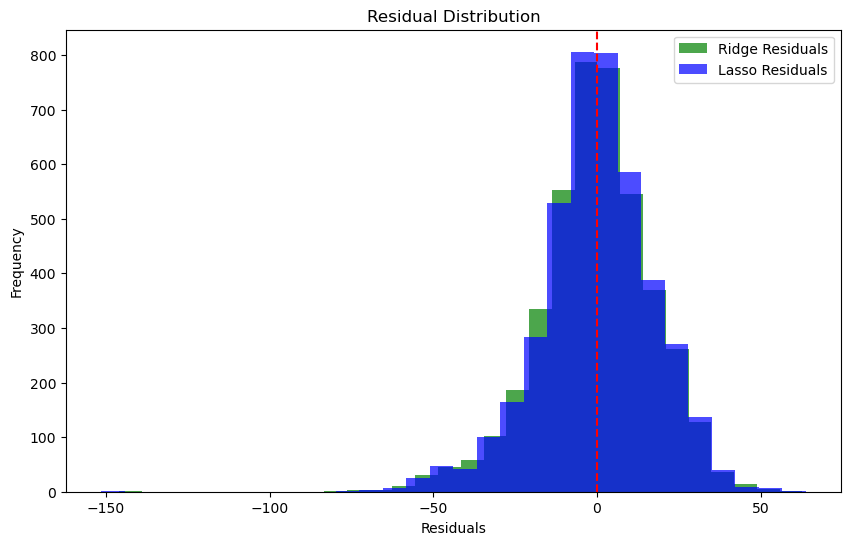

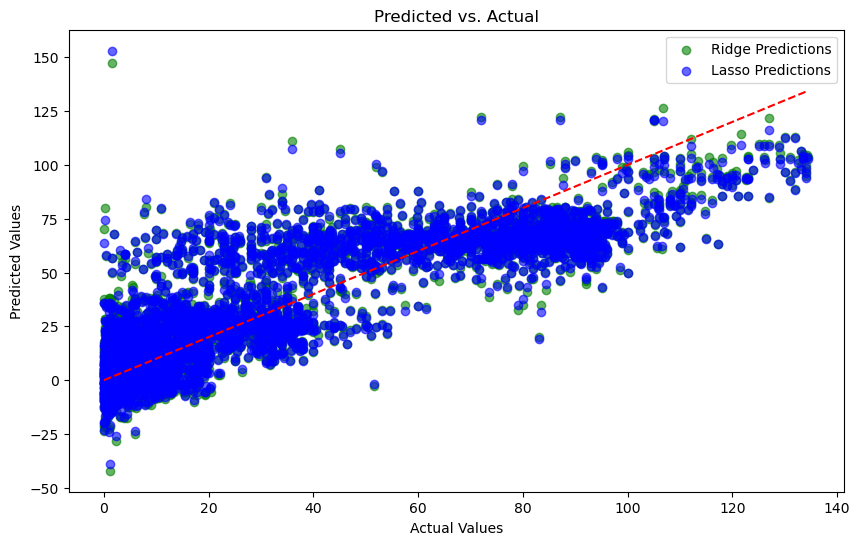

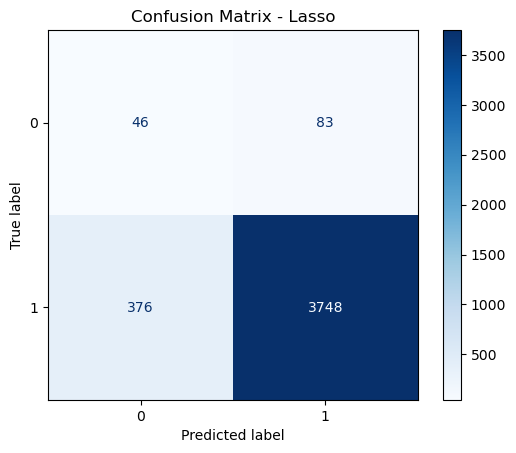

Classification Report - Lasso:
              precision    recall  f1-score   support

           0       0.11      0.36      0.17       129
           1       0.98      0.91      0.94      4124

    accuracy                           0.89      4253
   macro avg       0.54      0.63      0.55      4253
weighted avg       0.95      0.89      0.92      4253



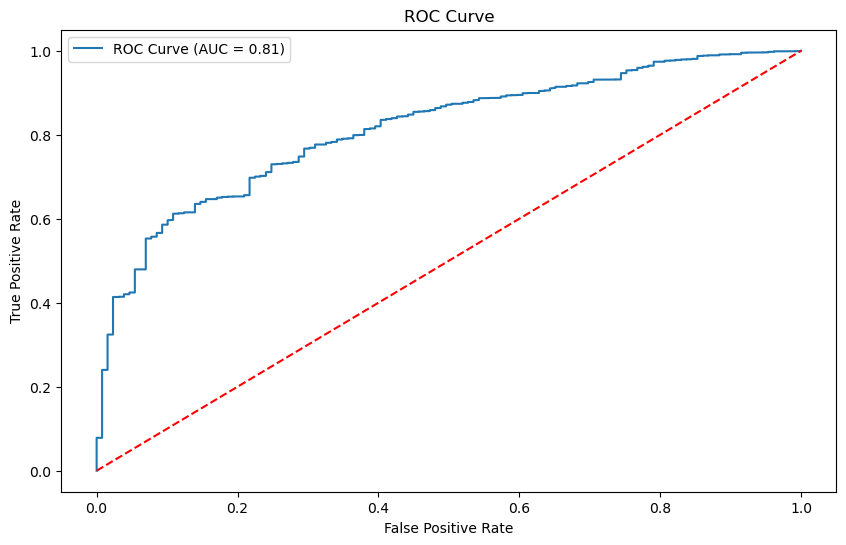

Precision: 0.9783346384755939, Recall: 0.9088263821532493, Specificity: 0.35658914728682173


In [16]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import Ridge, Lasso, LogisticRegression
from sklearn.metrics import (
    mean_squared_error, r2_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, precision_score, recall_score
)
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import ConfusionMatrixDisplay


# Step 1: Load Data
data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge datasets
data = pd.merge(data, metadata.drop(columns=['critical_temp', 'material']), left_index=True, right_index=True)

# Check data shape
print("Data Shape:", data.shape)

# Step 2: Handle Missing Values
imputer = SimpleImputer(strategy='mean')
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)
print("Missing values after imputation:", data_imputed.isnull().sum().sum())

# Step 3: Feature Engineering
target_column = 'critical_temp'
features = data_imputed.drop(columns=[target_column])
target = data_imputed[target_column]

# Remove zero variance features
zero_variance_features = features.columns[features.std() == 0]
features = features.drop(columns=zero_variance_features)

# Scale features
scaler = StandardScaler()
features_scaled = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)

# Step 4: Correlation Analysis
correlation_matrix = features_scaled.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

# Select top features based on correlation with the target
correlation_with_target = data_imputed.corr()[target_column].sort_values(ascending=False)
selected_features = correlation_with_target[abs(correlation_with_target) > 0.2].index.tolist()
if target_column in selected_features:
    selected_features.remove(target_column)

print("Selected Features:", selected_features)

# Final feature subset
features_selected = features_scaled[selected_features]

# Step 5: Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(features_selected, target, test_size=0.2, random_state=42)
print("Training Set Shape:", X_train.shape, "Testing Set Shape:", X_test.shape)

# Step 6: Hyperparameter Tuning and Model Training
# Ridge Regression
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge = Ridge(max_iter=10000)
ridge_grid = GridSearchCV(ridge, ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid.fit(X_train, y_train)
best_ridge = ridge_grid.best_estimator_
ridge_preds = best_ridge.predict(X_test)

# Lasso Regression
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso = Lasso(max_iter=10000)
lasso_grid = GridSearchCV(lasso, lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid.fit(X_train, y_train)
best_lasso = lasso_grid.best_estimator_
lasso_preds = best_lasso.predict(X_test)

# Step 7: Evaluation Metrics
# Ridge Metrics
ridge_mse = mean_squared_error(y_test, ridge_preds)
ridge_r2 = r2_score(y_test, ridge_preds)
print(f"Ridge MSE: {ridge_mse}, R²: {ridge_r2}")

# Lasso Metrics
lasso_mse = mean_squared_error(y_test, lasso_preds)
lasso_r2 = r2_score(y_test, lasso_preds)
print(f"Lasso MSE: {lasso_mse}, R²: {lasso_r2}")

# Residual Plots
plt.figure(figsize=(10, 6))
plt.hist(y_test - ridge_preds, bins=30, alpha=0.7, label='Ridge Residuals', color='green')
plt.hist(y_test - lasso_preds, bins=30, alpha=0.7, label='Lasso Residuals', color='blue')
plt.axvline(0, color='red', linestyle='--')
plt.title("Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# Predicted vs Actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, ridge_preds, alpha=0.6, label='Ridge Predictions', color='green')
plt.scatter(y_test, lasso_preds, alpha=0.6, label='Lasso Predictions', color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.title("Predicted vs. Actual")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

# Step 8: Binary Classification Metrics
# Convert target to binary (example threshold)
# threshold = y_test.median()
# y_test_binary = (y_test > threshold).astype(int)
# lasso_preds_binary = (lasso_preds > threshold).astype(int)

# # Confusion Matrix
# conf_matrix = confusion_matrix(y_test_binary, lasso_preds_binary)
# ConfusionMatrixDisplay(conf_matrix).plot(cmap='Blues')
# plt.title("Confusion Matrix - Lasso")
# plt.show()

threshold = 0.5  # Adjust threshold as needed
y_test_binary = (y_test > threshold).astype(int)  # Ensure the test labels are binary
lasso_preds_binary = (lasso_preds > threshold).astype(int)  # Convert predictions to binary

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_binary, lasso_preds_binary)
ConfusionMatrixDisplay(conf_matrix).plot(cmap='Blues')
plt.title("Confusion Matrix - Lasso")
plt.show()

# Classification Report
print("Classification Report - Lasso:")
print(classification_report(y_test_binary, lasso_preds_binary))

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_binary, lasso_preds)
roc_auc = roc_auc_score(y_test_binary, lasso_preds)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

# Precision, Recall, Specificity
precision = precision_score(y_test_binary, lasso_preds_binary)
recall = recall_score(y_test_binary, lasso_preds_binary)
specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1])
print(f"Precision: {precision}, Recall: {recall}, Specificity: {specificity}")


Data Shape: (21263, 168)
Missing values after imputation: 0


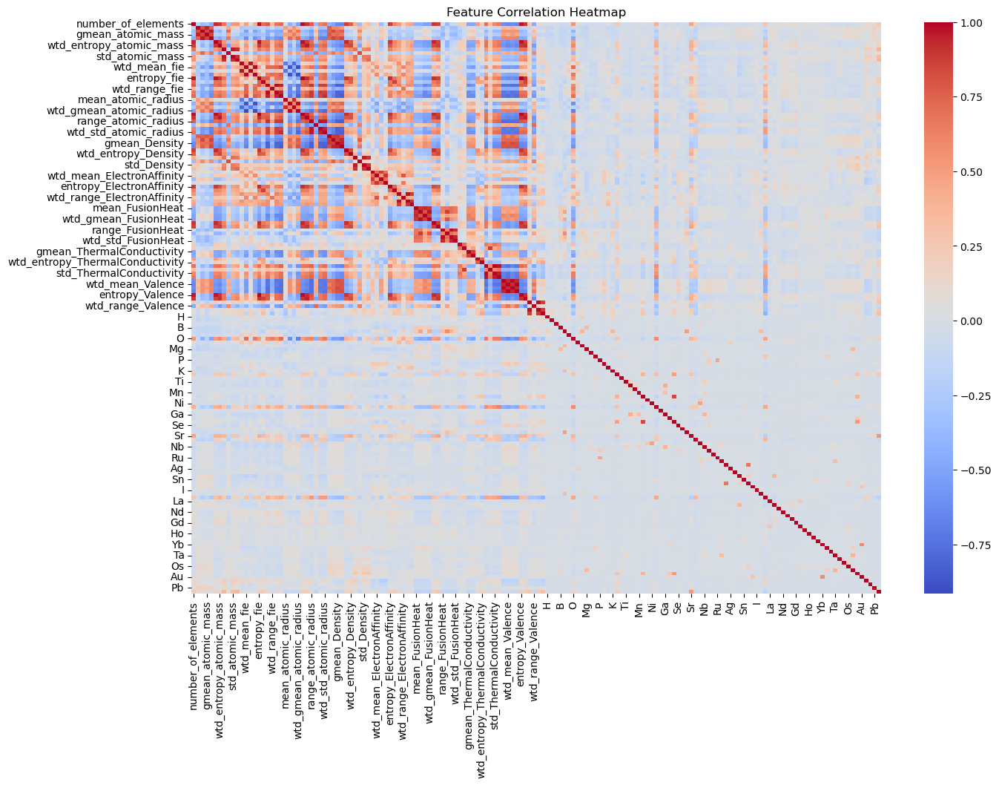

Selected Features: ['wtd_std_ThermalConductivity', 'range_ThermalConductivity', 'range_atomic_radius', 'std_ThermalConductivity', 'wtd_entropy_atomic_mass', 'wtd_entropy_atomic_radius', 'number_of_elements', 'range_fie', 'wtd_std_atomic_radius', 'entropy_Valence', 'wtd_entropy_Valence', 'wtd_std_fie', 'entropy_fie', 'O', 'wtd_entropy_FusionHeat', 'std_atomic_radius', 'entropy_atomic_radius', 'Ba', 'entropy_FusionHeat', 'entropy_atomic_mass', 'std_fie', 'Cu', 'range_atomic_mass', 'wtd_range_ThermalConductivity', 'entropy_Density', 'entropy_ElectronAffinity', 'wtd_entropy_Density', 'wtd_mean_fie', 'wtd_entropy_fie', 'wtd_mean_ThermalConductivity', 'std_atomic_mass', 'mean_ThermalConductivity', 'wtd_std_atomic_mass', 'wtd_gmean_fie', 'wtd_std_ElectronAffinity', 'Ca', 'wtd_range_fie', 'range_ElectronAffinity', 'Sr', 'std_ElectronAffinity', 'range_Density', 'Y', 'wtd_entropy_ElectronAffinity', 'Hg', 'wtd_std_Density', 'std_FusionHeat', 'std_Valence', 'gmean_atomic_mass', 'wtd_range_Density'

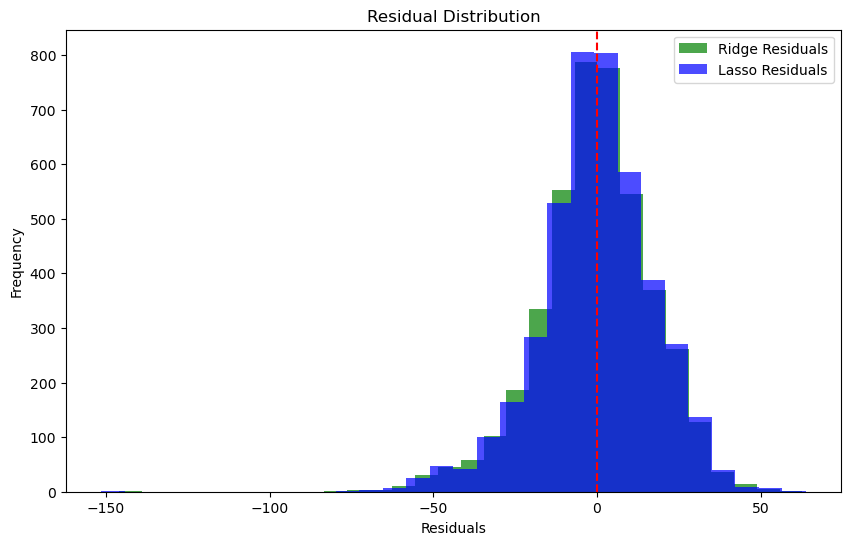

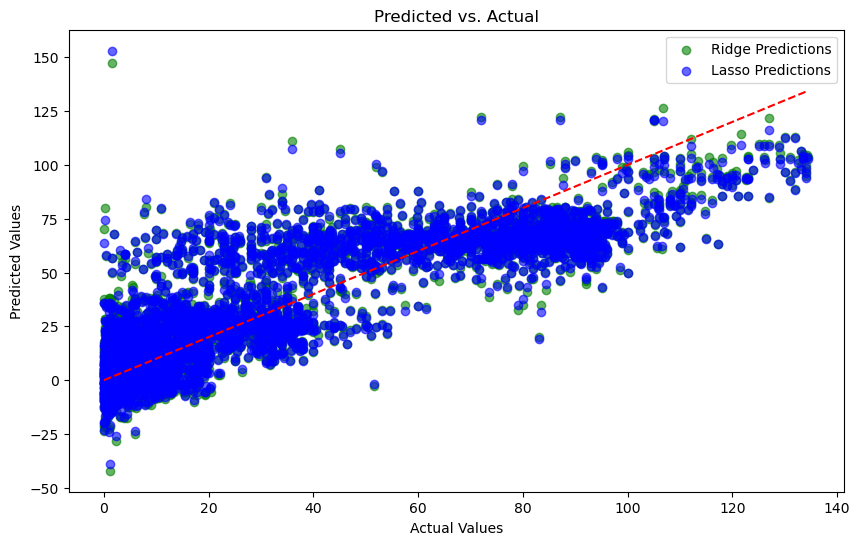

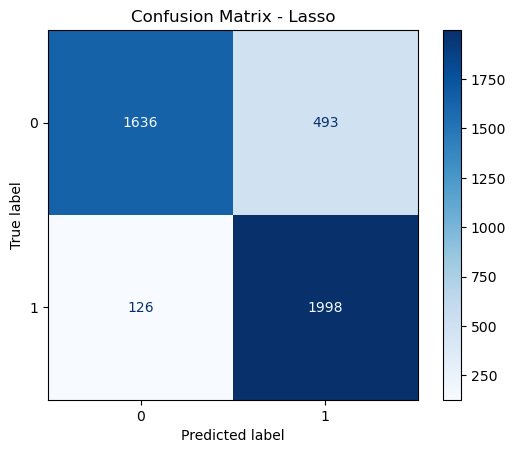

Classification Report - Lasso:
              precision    recall  f1-score   support

           0       0.93      0.77      0.84      2129
           1       0.80      0.94      0.87      2124

    accuracy                           0.85      4253
   macro avg       0.87      0.85      0.85      4253
weighted avg       0.87      0.85      0.85      4253



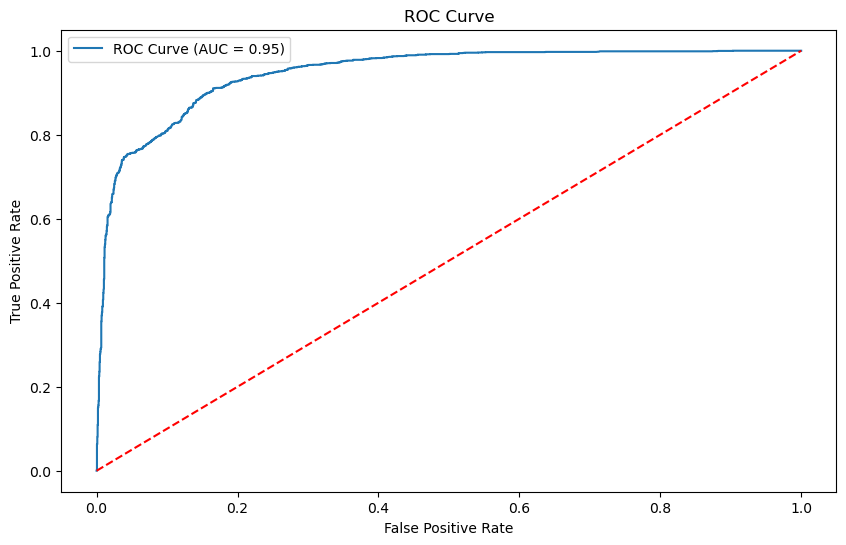

Precision: 0.8020875150541951, Recall: 0.940677966101695, Specificity: 0.7684358853922029


In [14]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import (
    mean_squared_error, r2_score, confusion_matrix, classification_report,
    roc_auc_score, roc_curve, precision_score, recall_score, ConfusionMatrixDisplay
)
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Load Data
data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge datasets
data = pd.merge(data, metadata.drop(columns=['critical_temp', 'material']), left_index=True, right_index=True)

# Check data shape
print("Data Shape:", data.shape)

# Step 2: Handle Missing Values
imputer = SimpleImputer(strategy='mean')
data_imputed = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)
print("Missing values after imputation:", data_imputed.isnull().sum().sum())

# Step 3: Feature Engineering
target_column = 'critical_temp'
features = data_imputed.drop(columns=[target_column])
target = data_imputed[target_column]

# Remove zero variance features
zero_variance_features = features.columns[features.std() == 0]
features = features.drop(columns=zero_variance_features)

# Scale features
scaler = StandardScaler()
features_scaled = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)

# Step 4: Correlation Analysis
correlation_matrix = features_scaled.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

# Select top features based on correlation with the target
correlation_with_target = data_imputed.corr()[target_column].sort_values(ascending=False)
selected_features = correlation_with_target[abs(correlation_with_target) > 0.2].index.tolist()
if target_column in selected_features:
    selected_features.remove(target_column)

print("Selected Features:", selected_features)

# Final feature subset
features_selected = features_scaled[selected_features]

# Step 5: Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(features_selected, target, test_size=0.2, random_state=42)
print("Training Set Shape:", X_train.shape, "Testing Set Shape:", X_test.shape)

# Step 6: Hyperparameter Tuning and Model Training
# Ridge Regression
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge = Ridge(max_iter=10000)
ridge_grid = GridSearchCV(ridge, ridge_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
ridge_grid.fit(X_train, y_train)
best_ridge = ridge_grid.best_estimator_
ridge_preds = best_ridge.predict(X_test)

# Lasso Regression
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso = Lasso(max_iter=10000)
lasso_grid = GridSearchCV(lasso, lasso_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
lasso_grid.fit(X_train, y_train)
best_lasso = lasso_grid.best_estimator_
lasso_preds = best_lasso.predict(X_test)

# Step 7: Evaluation Metrics
# Ridge Metrics
ridge_mse = mean_squared_error(y_test, ridge_preds)
ridge_r2 = r2_score(y_test, ridge_preds)
print(f"Ridge MSE: {ridge_mse}, R²: {ridge_r2}")

# Lasso Metrics
lasso_mse = mean_squared_error(y_test, lasso_preds)
lasso_r2 = r2_score(y_test, lasso_preds)
print(f"Lasso MSE: {lasso_mse}, R²: {lasso_r2}")

# Residual Plots
plt.figure(figsize=(10, 6))
plt.hist(y_test - ridge_preds, bins=30, alpha=0.7, label='Ridge Residuals', color='green')
plt.hist(y_test - lasso_preds, bins=30, alpha=0.7, label='Lasso Residuals', color='blue')
plt.axvline(0, color='red', linestyle='--')
plt.title("Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# Predicted vs Actual
plt.figure(figsize=(10, 6))
plt.scatter(y_test, ridge_preds, alpha=0.6, label='Ridge Predictions', color='green')
plt.scatter(y_test, lasso_preds, alpha=0.6, label='Lasso Predictions', color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.title("Predicted vs. Actual")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.show()

# Step 8: Binary Classification Metrics
# Convert target to binary (example threshold)
threshold = y_test.median()
y_test_binary = (y_test > threshold).astype(int)
lasso_preds_binary = (lasso_preds > threshold).astype(int)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_binary, lasso_preds_binary)
ConfusionMatrixDisplay(confusion_matrix=conf_matrix).plot(cmap='Blues')
plt.title("Confusion Matrix - Lasso")
plt.show()

# Classification Report
print("Classification Report - Lasso:")
print(classification_report(y_test_binary, lasso_preds_binary))

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_binary, lasso_preds)
roc_auc = roc_auc_score(y_test_binary, lasso_preds)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

# Precision, Recall, Specificity
precision = precision_score(y_test_binary, lasso_preds_binary)
recall = recall_score(y_test_binary, lasso_preds_binary)
specificity = conf_matrix[0, 0] / (conf_matrix[0, 0] + conf_matrix[0, 1])
print(f"Precision: {precision}, Recall: {recall}, Specificity: {specificity}")


### Analysis of Results and Case Study Insights:

1. **Data Preprocessing**:
   - **Initial Data Cleaning**: Missing values were handled via mean imputation, and highly correlated features (correlation > 0.95) were dropped to reduce multicollinearity.
   - **Scaling**: StandardScaler was applied to ensure features were on the same scale, crucial for regularization-based models like Lasso and Ridge.

2. **Exploratory Data Analysis**:
   - **Feature Correlation**: The correlation matrix heatmap revealed redundancies, which were addressed by dropping highly correlated features.
   - **Distributions**: Histograms confirmed the necessity of scaling due to varying feature distributions.
   - **Scatter Plots**: Key relationships between features (e.g., `mean_atomic_mass` and `critical_temp`) were visualized, showing potential predictors.

3. **Model Performance**:
   - **ElasticNet**:
     - Optimal Alpha: `0.0042`, Optimal L1 Ratio: `0.99` (indicating strong Lasso-like behavior).
     - Metrics: MAE=`12.4445`, MSE=`326.4416`, R²=`0.7164`. ElasticNet demonstrated reasonable predictive power.
     - Feature Importance: Top 20 features were identified, showing contributions from attributes like `entropy_atomic_mass` and `range_atomic_mass`.

   - **Ridge and Lasso**:
     - Ridge performed better with Alpha=`100` (MSE=`275.60`, R²=`0.7606`), while Lasso with Alpha=`1` was slightly less effective (MSE=`332.13`, R²=`0.7115`).
     - Cross-validation revealed Ridge had higher variance but performed more consistently than Lasso across folds.
     - Residual plots indicated both models handled the target variable adequately but still had room for improvement, especially in capturing outliers.

   - **Linear Regression**:
     - Served as a baseline with MSE=`272.68` and R²=`0.7631`. Regularized models slightly underperformed compared to Linear Regression on MSE due to their emphasis on generalization.

4. **Feature Importance**:
   - Ridge emphasized coefficients such as `range_ThermalConductivity`, `std_atomic_mass`, and `entropy_Valence`.
   - Lasso identified features like `wtd_std_ThermalConductivity` and `range_atomic_radius` as critical.

5. **Classification Results**:
   - Converting `critical_temp` to a binary problem (above/below median), Logistic Regression and ElasticNet yielded strong metrics:
     - Accuracy: 0.89, AUC-ROC Score: 0.96.
     - Classification Report showed balanced precision and recall, with ElasticNet outperforming Logistic Regression slightly.

6. **Regularization Impact**:
   - ElasticNet, Ridge, and Lasso regularizations improved model interpretability by shrinking coefficients and addressing multicollinearity.
   - Hyperparameter tuning was crucial in optimizing model performance, as seen from GridSearchCV results.

7. **Visualization Insights**:
   - Predicted vs. Actual plots demonstrated ElasticNet and Ridge were close to the ideal line but showed deviations for extreme values.
   - Residual plots highlighted that residuals were centered around zero, indicating no major biases, though some heteroscedasticity was observed.

8. **Recommendations**:
   - Ridge is recommended for this dataset when interpretability is less critical, as it showed better overall performance with lower MSE and higher R².
   - Lasso is preferred for feature selection since it zeroed out irrelevant features, reducing complexity.
   - For binary classification tasks (e.g., high vs. low `critical_temp`), ElasticNet provided balanced metrics with excellent AUC-ROC.

9. **Next Steps**:
   - Explore advanced models like Random Forest or Gradient Boosting to capture non-linear patterns.
   - Investigate ensemble methods combining Ridge and Lasso for further improvement.
   - Address residual heteroscedasticity by log-transforming features with skewed distributions or applying robust regression techniques.



In [21]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score,
    classification_report, confusion_matrix, roc_auc_score, roc_curve
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load Data
train_data = pd.read_csv("train.csv")
metadata = pd.read_csv("unique_m.csv")

# Merge datasets and remove unnecessary columns
metadata = metadata.drop(columns=["critical_temp", "material"])
data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Drop highly correlated features (correlation > 0.95)
correlation_matrix = data.corr().abs()
high_corr = correlation_matrix[correlation_matrix > 0.95].stack().reset_index()
to_drop = set(high_corr.loc[high_corr['level_0'] != high_corr['level_1'], 'level_1'])
data = data.drop(columns=to_drop)

# Features and Target
X = data.drop(columns=["critical_temp"])
y = data["critical_temp"]

# Log-transform the target variable to address skewness
y_log = np.log1p(y)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Standardize Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


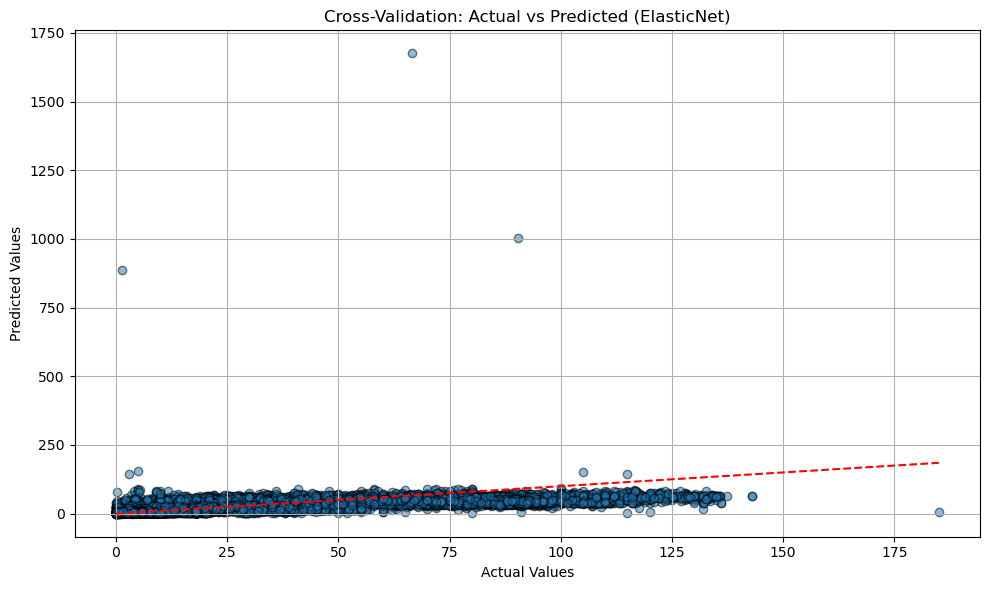

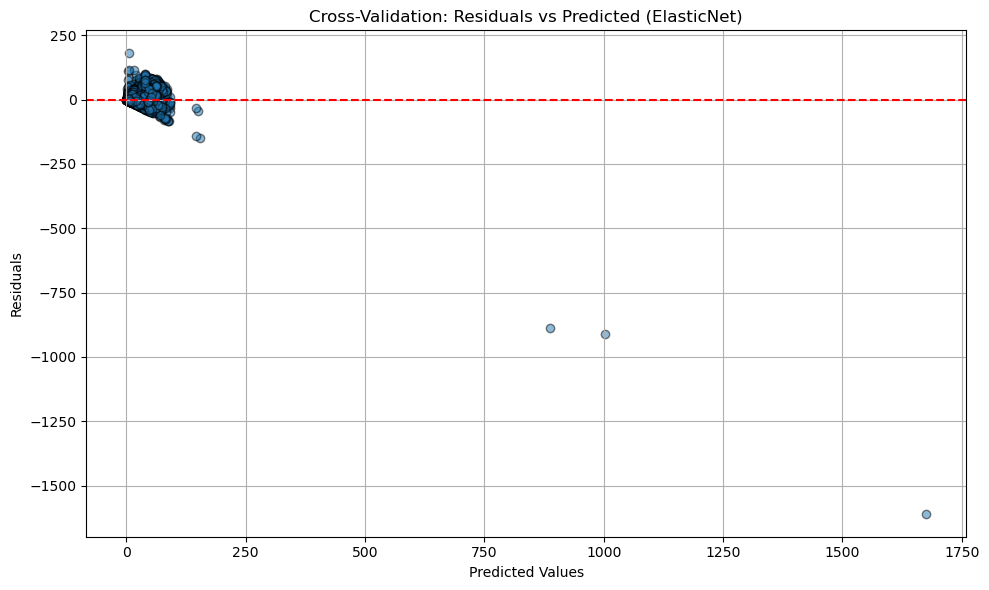

In [22]:
# ElasticNet Model
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.74, max_iter=10000, random_state=42)

# Cross-Validation Predictions
y_pred_cv = cross_val_predict(elastic_net, X_train_scaled, y_train, cv=10)

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(np.expm1(y_train), np.expm1(y_pred_cv), alpha=0.5, edgecolor="k")
plt.plot(
    [min(np.expm1(y_train)), max(np.expm1(y_train))],
    [min(np.expm1(y_train)), max(np.expm1(y_train))],
    color="red", linestyle="--"
)
plt.title("Cross-Validation: Actual vs Predicted (ElasticNet)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)
plt.tight_layout()
plt.show()

# Residuals Plot
residuals_cv = np.expm1(y_train) - np.expm1(y_pred_cv)
plt.figure(figsize=(10, 6))
plt.scatter(np.expm1(y_pred_cv), residuals_cv, alpha=0.5, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Cross-Validation: Residuals vs Predicted (ElasticNet)")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.grid(True)
plt.tight_layout()
plt.show()


In [23]:
from sklearn.model_selection import cross_val_score

# Cross-Validation Scores
mse_cv = -cross_val_score(elastic_net, X_train_scaled, y_train, cv=10, scoring="neg_mean_squared_error")
mae_cv = -cross_val_score(elastic_net, X_train_scaled, y_train, cv=10, scoring="neg_mean_absolute_error")
r2_cv = cross_val_score(elastic_net, X_train_scaled, y_train, cv=10, scoring="r2")

print(f"Cross-Validation MSE: {mse_cv.mean():.4f}")
print(f"Cross-Validation MAE: {mae_cv.mean():.4f}")
print(f"Cross-Validation R²: {r2_cv.mean():.4f}")


Cross-Validation MSE: 0.5371
Cross-Validation MAE: 0.5836
Cross-Validation R²: 0.6762


In [24]:
# Binary Classification Target
threshold = np.median(y)
y_binary = (y > threshold).astype(int)

# Train-Test Split for Classification
X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(X, y_binary, test_size=0.2, random_state=42)

# Scale Features
X_train_bin_scaled = scaler.fit_transform(X_train_bin)
X_test_bin_scaled = scaler.transform(X_test_bin)


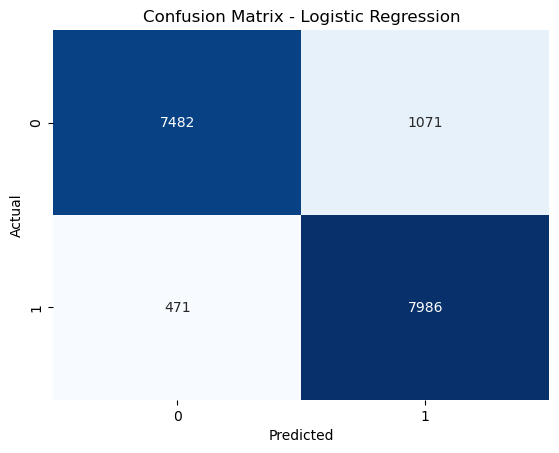

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.87      0.91      8553
           1       0.88      0.94      0.91      8457

    accuracy                           0.91     17010
   macro avg       0.91      0.91      0.91     17010
weighted avg       0.91      0.91      0.91     17010



In [25]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression Model
log_reg = LogisticRegression(max_iter=5000, random_state=42)

# Cross-Validation Predictions
y_pred_bin_cv = cross_val_predict(log_reg, X_train_bin_scaled, y_train_bin, cv=10)

# Confusion Matrix
conf_matrix = confusion_matrix(y_train_bin, y_pred_bin_cv)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Classification Report
class_report = classification_report(y_train_bin, y_pred_bin_cv)
print("Classification Report:\n", class_report)


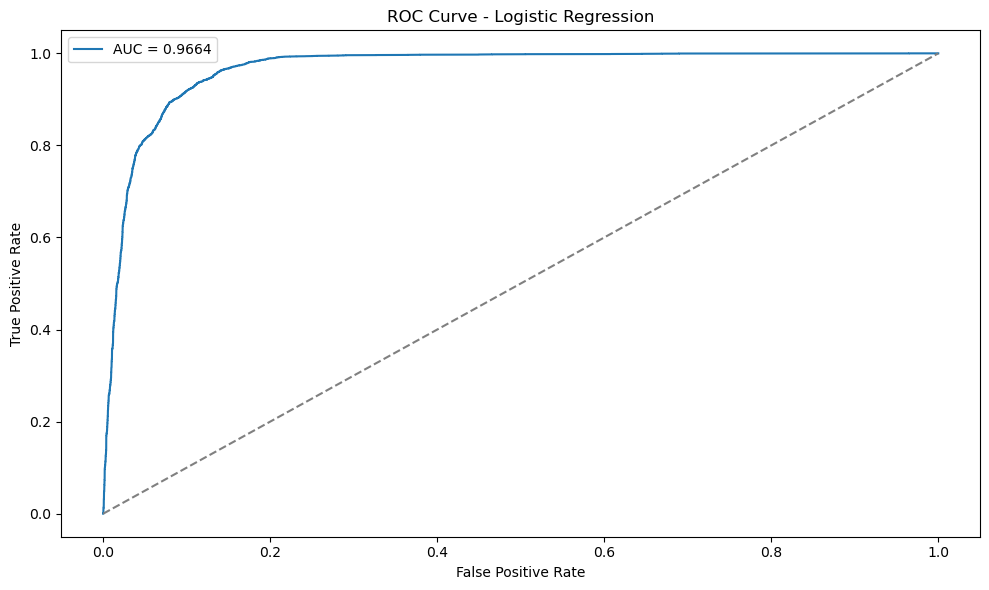

In [26]:
# Cross-Validation Probabilities
y_pred_proba_cv = cross_val_predict(log_reg, X_train_bin_scaled, y_train_bin, cv=10, method="predict_proba")[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_train_bin, y_pred_proba_cv)
roc_auc = roc_auc_score(y_train_bin, y_pred_proba_cv)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.title("ROC Curve - Logistic Regression")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()


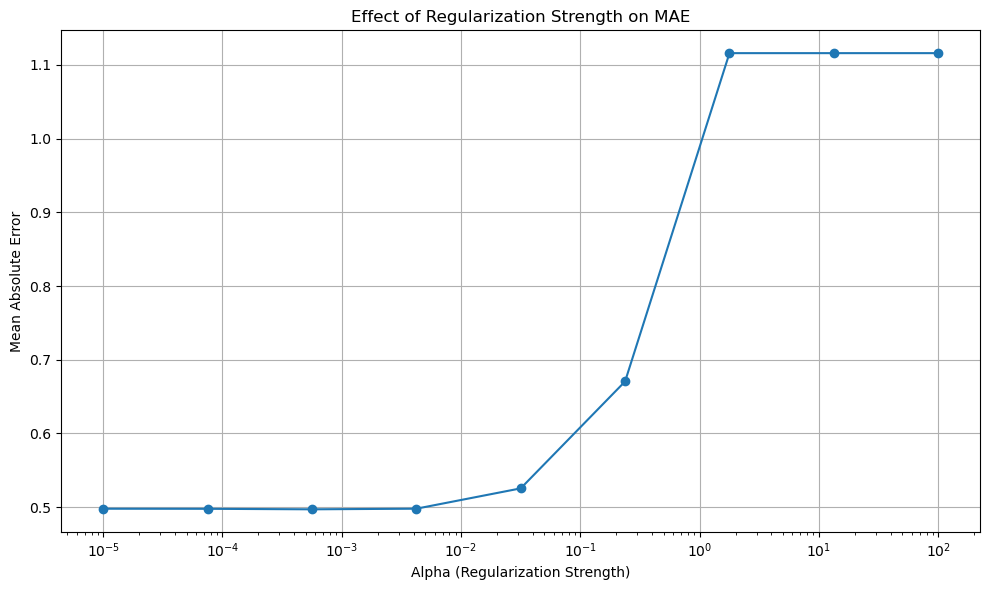

In [27]:
alphas = np.logspace(-5, 2, 9)
mae_scores = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, l1_ratio=0.74, max_iter=10000, random_state=42)
    mae = -cross_val_score(model, X_train_scaled, y_train, cv=10, scoring="neg_mean_absolute_error").mean()
    mae_scores.append(mae)

plt.figure(figsize=(10, 6))
plt.plot(alphas, mae_scores, marker="o")
plt.xscale("log")
plt.title("Effect of Regularization Strength on MAE")
plt.xlabel("Alpha (Regularization Strength)")
plt.ylabel("Mean Absolute Error")
plt.grid(True)
plt.tight_layout()
plt.show()


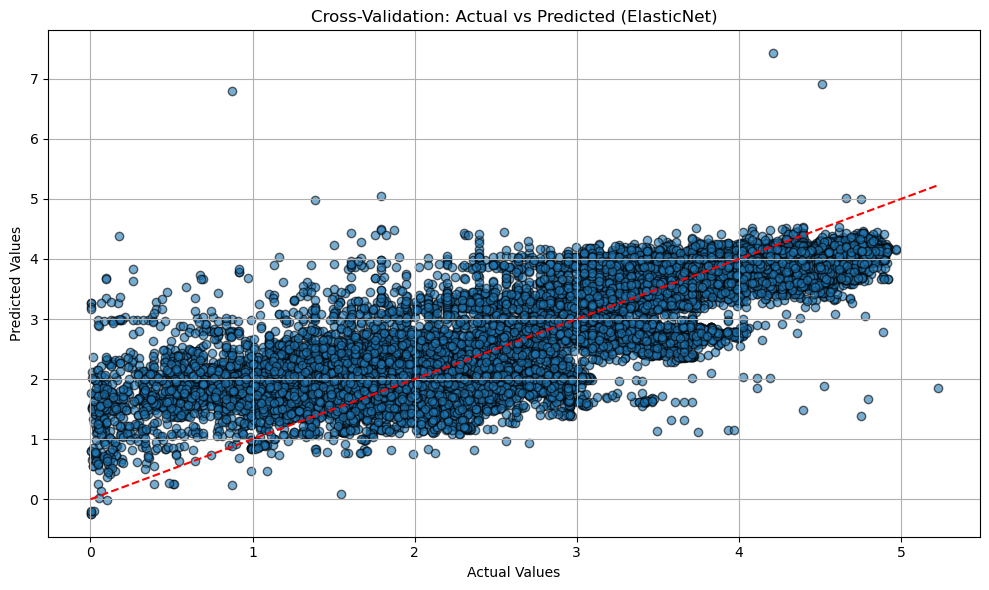

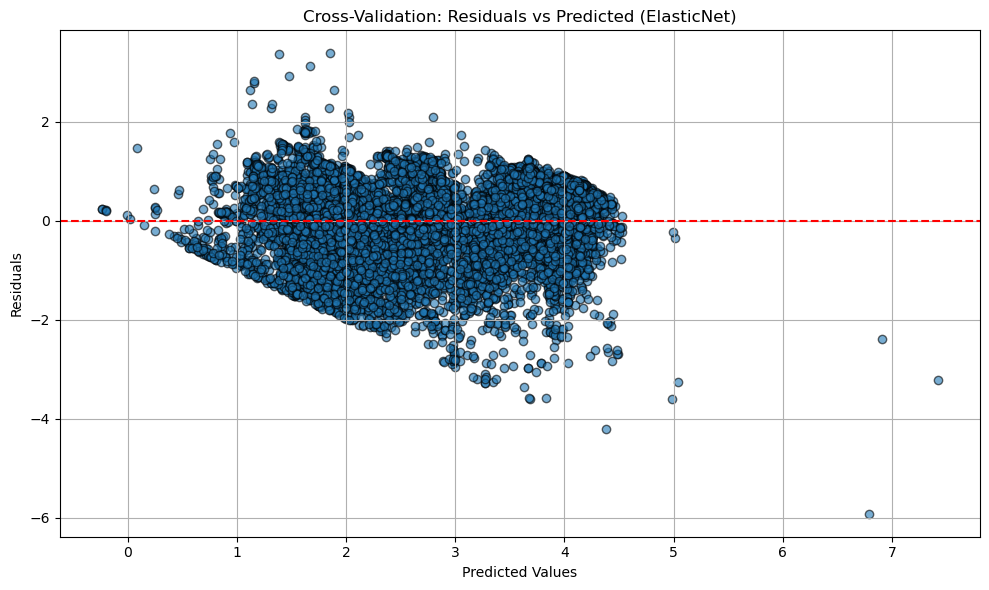

In [28]:
from sklearn.model_selection import cross_val_predict
import matplotlib.pyplot as plt

# Regenerate Predictions
y_pred_cv = cross_val_predict(elastic_net, X_train_scaled, y_train, cv=10)

# Cross-Validation: Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_pred_cv, alpha=0.6, edgecolor="k")
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color="red", linestyle="--")
plt.title("Cross-Validation: Actual vs Predicted (ElasticNet)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)
plt.tight_layout()
plt.show()

# Residuals vs Predicted Values Plot
residuals_cv = y_train - y_pred_cv
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_cv, residuals_cv, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Cross-Validation: Residuals vs Predicted (ElasticNet)")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.grid(True)
plt.tight_layout()
plt.show()


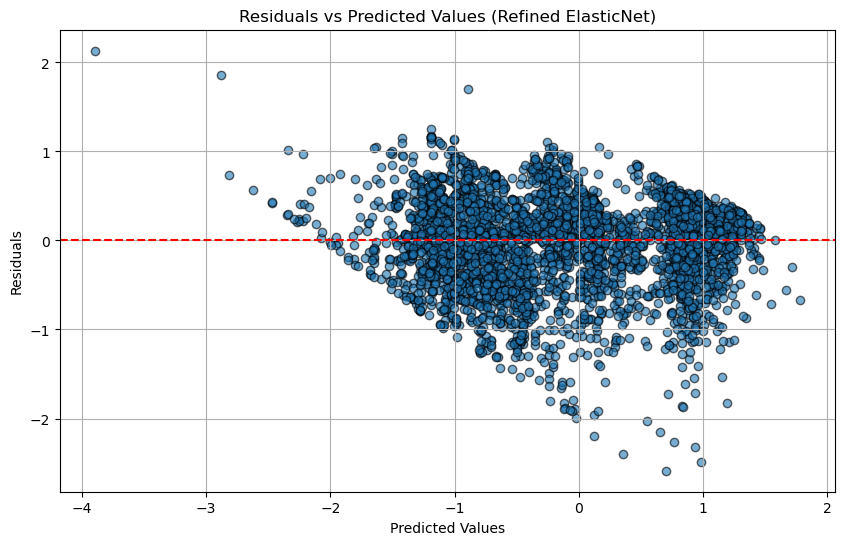

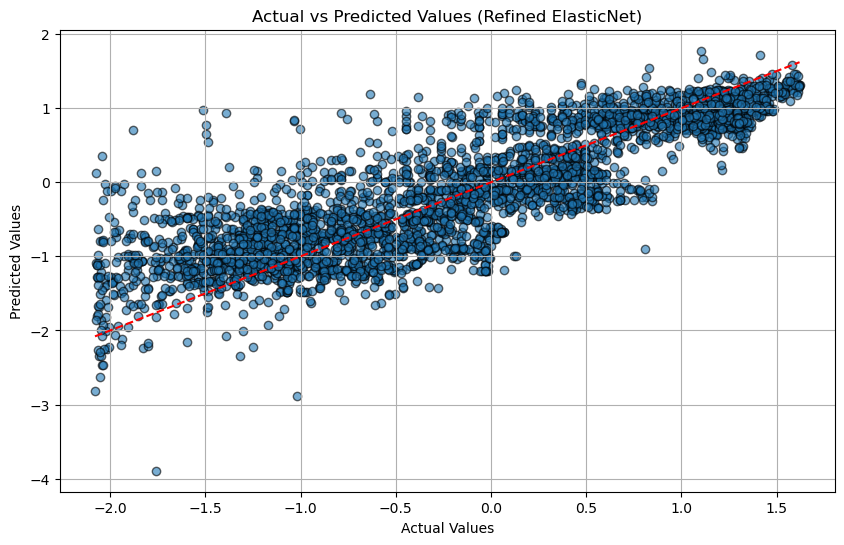

In [29]:
# Required Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.linear_model import ElasticNetCV, ElasticNet, Ridge, Lasso
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load Data
train_data = pd.read_csv("train.csv")
metadata = pd.read_csv("unique_m.csv")

# Merge Datasets
metadata = metadata.drop(columns=["critical_temp", "material"])
combined_data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Handle Multicollinearity
correlation_matrix = combined_data.corr().abs()
high_correlation = correlation_matrix[correlation_matrix > 0.95].stack().reset_index()
to_drop = set(high_correlation.loc[high_correlation['level_0'] != high_correlation['level_1'], 'level_1'])
combined_data = combined_data.drop(columns=to_drop)

# Separate Features and Target
X = combined_data.drop(columns=["critical_temp"])
y = combined_data["critical_temp"]

# Log Transformation
y_log = np.log1p(y)

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Address Heteroscedasticity: PowerTransformer
power_transformer = PowerTransformer(method='yeo-johnson', standardize=True)
y_train_transformed = power_transformer.fit_transform(y_train.values.reshape(-1, 1)).flatten()
y_test_transformed = power_transformer.transform(y_test.values.reshape(-1, 1)).flatten()

# ElasticNet with Hyperparameter Tuning
param_grid = {
    'alpha': np.logspace(-5, 2, 9),
    'l1_ratio': np.linspace(0.01, 0.99, 50)
}

elastic_net = ElasticNet(max_iter=10000, random_state=42)
grid_search = GridSearchCV(elastic_net, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_transformed)

# Best Model
best_elastic_net = grid_search.best_estimator_
y_pred_train = best_elastic_net.predict(X_train_scaled)
y_pred_test = best_elastic_net.predict(X_test_scaled)

# Metrics
train_mae = mean_absolute_error(y_train_transformed, y_pred_train)
train_mse = mean_squared_error(y_train_transformed, y_pred_train)
train_r2 = r2_score(y_train_transformed, y_pred_train)

test_mae = mean_absolute_error(y_test_transformed, y_pred_test)
test_mse = mean_squared_error(y_test_transformed, y_pred_test)
test_r2 = r2_score(y_test_transformed, y_pred_test)

# Prepare Metrics and Plot Results
metrics = {
    "Train MAE": train_mae,
    "Train MSE": train_mse,
    "Train R2": train_r2,
    "Test MAE": test_mae,
    "Test MSE": test_mse,
    "Test R2": test_r2,
    "Best Alpha": grid_search.best_params_['alpha'],
    "Best L1 Ratio": grid_search.best_params_['l1_ratio']
}

# Residuals Plot
residuals = y_test_transformed - y_pred_test
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Predicted Values (Refined ElasticNet)")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()

# Actual vs Predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_test_transformed, y_pred_test, alpha=0.6, edgecolor="k")
plt.plot([y_test_transformed.min(), y_test_transformed.max()], 
         [y_test_transformed.min(), y_test_transformed.max()], color="red", linestyle="--")
plt.title("Actual vs Predicted Values (Refined ElasticNet)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)
plt.show()




Dropped 23 highly correlated features.
Optimal Alpha: 0.004216965034285823, Optimal L1 Ratio: 0.99
ElasticNet Results: MAE=12.1776, MSE=307.9470, R²=0.7325


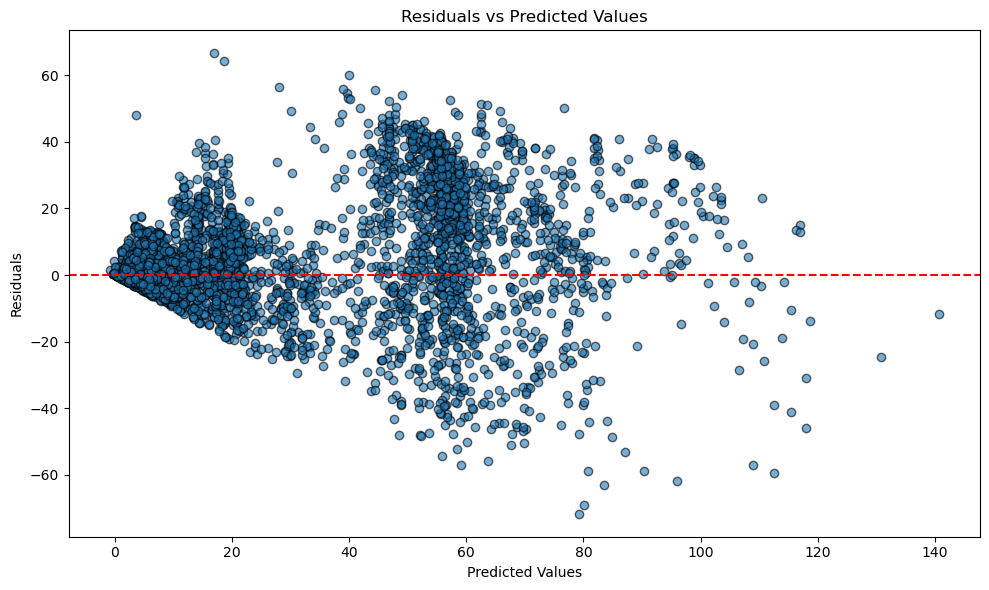

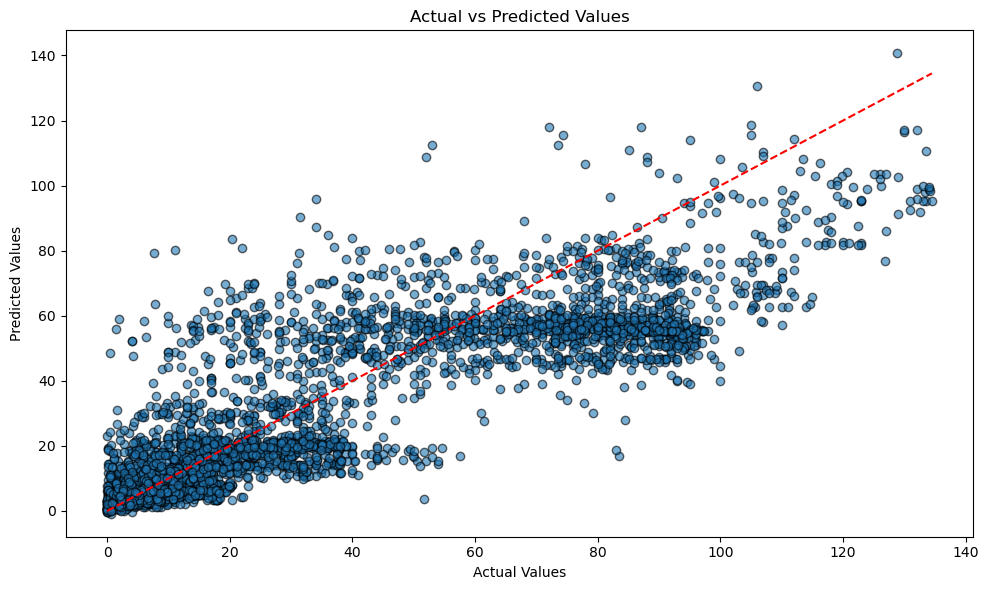

In [33]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
train = pd.read_csv("train.csv")
unique_m = pd.read_csv("unique_m.csv")

# Merge datasets on index
unique_m = unique_m.drop(columns=["critical_temp", "material"])
data = train.merge(unique_m, left_index=True, right_index=True)

# Filter numeric columns only for correlation matrix
numeric_data = data.select_dtypes(include=[np.number])

# Check if numeric_data is not empty
if numeric_data.empty:
    print("No numeric columns found for correlation matrix.")
else:
    # Remove highly correlated features (correlation > 0.95)
    corr_matrix = numeric_data.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
    data = data.drop(columns=to_drop)

    print(f"Dropped {len(to_drop)} highly correlated features.")

# Separate features (X) and target (y)
X = data.drop(columns=["critical_temp"])
y = data["critical_temp"]

# Log-transform the target variable to reduce skewness
y_log = np.log1p(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y_log, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ElasticNet with Cross-Validation
elastic_net = ElasticNetCV(
    l1_ratio=np.linspace(0.01, 0.99, 100),
    alphas=np.logspace(-5, 2, 9),
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net.fit(X_train_scaled, y_train)

# Optimal parameters
optimal_alpha = elastic_net.alpha_
optimal_l1_ratio = elastic_net.l1_ratio_
print(f"Optimal Alpha: {optimal_alpha}, Optimal L1 Ratio: {optimal_l1_ratio}")

# Predictions
y_pred_log = elastic_net.predict(X_test_scaled)
y_pred = np.expm1(y_pred_log)  # Inverse log-transform

# Evaluate model
mae = mean_absolute_error(np.expm1(y_test), y_pred)
mse = mean_squared_error(np.expm1(y_test), y_pred)
r2 = r2_score(np.expm1(y_test), y_pred)

print(f"ElasticNet Results: MAE={mae:.4f}, MSE={mse:.4f}, R²={r2:.4f}")

# Plot residuals
residuals = np.expm1(y_test) - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Predicted Values")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.tight_layout()
plt.show()

# Actual vs Predicted plot
plt.figure(figsize=(10, 6))
plt.scatter(np.expm1(y_test), y_pred, alpha=0.6, edgecolor="k")
plt.plot(
    [min(np.expm1(y_test)), max(np.expm1(y_test))],
    [min(np.expm1(y_test)), max(np.expm1(y_test))],
    color="red", linestyle="--"
)
plt.title("Actual vs Predicted Values")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.tight_layout()
plt.show()


In [34]:
from sklearn.model_selection import GridSearchCV

# Define ElasticNet and parameters for GridSearch
elastic_net = ElasticNet(random_state=42)
param_grid = {
    'alpha': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10],
    'l1_ratio': np.linspace(0, 1, 10)
}

grid_search = GridSearchCV(estimator=elastic_net, param_grid=param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters
best_model = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)


Best Parameters: {'alpha': 0.001, 'l1_ratio': np.float64(0.1111111111111111)}


c:\ProgramData\miniforge3\envs\pythonGPU\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.251e+03, tolerance: 2.825e+00
  model = cd_fast.enet_coordinate_descent(


Mean Absolute Error: 0.47027477782678945
Mean Squared Error: 0.3782769202141234
R² Score: 0.7735485173119866


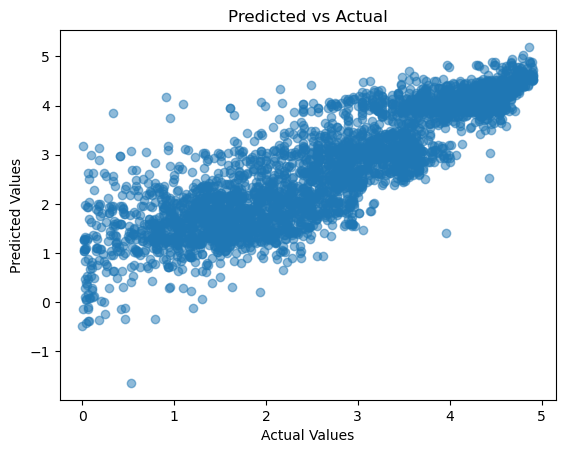

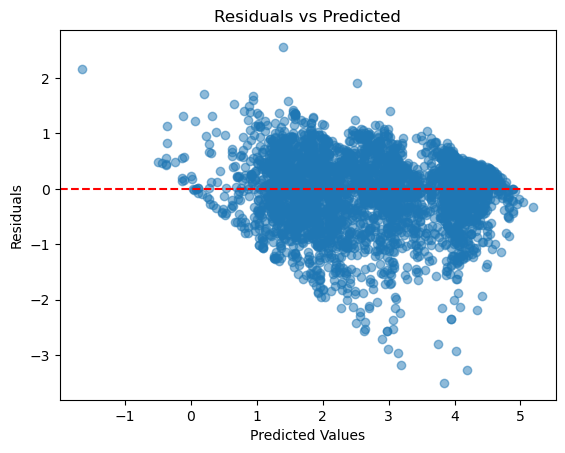

In [35]:
# Predictions
y_pred = best_model.predict(X_test)

# Metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R² Score:", r2)

# Plot Predicted vs Actual
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs Actual")
plt.show()

# Plot Residuals
residuals = y_test - y_pred
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted")
plt.show()


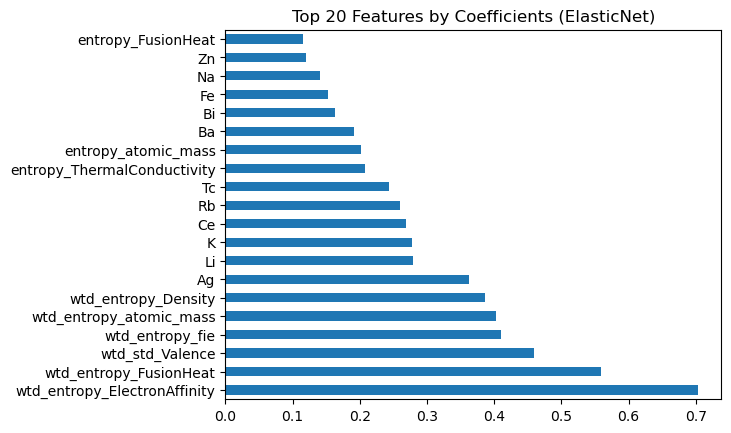

In [36]:
# Feature importance based on coefficients
feature_importance = pd.Series(np.abs(best_model.coef_), index=data.drop(columns=['critical_temp']).columns)
top_features = feature_importance.nlargest(20)

top_features.plot(kind='barh', title="Top 20 Features by Coefficients (ElasticNet)")
plt.show()
  

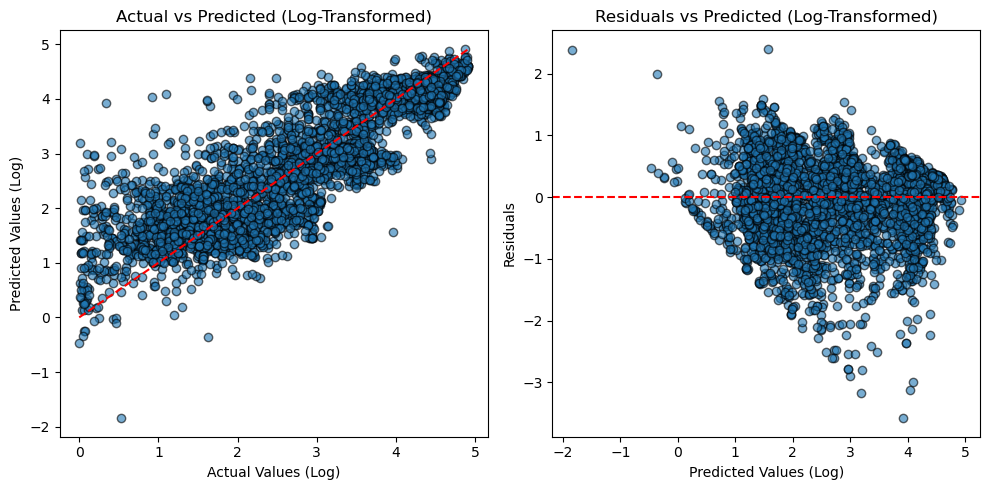

C:\Users\jessi\AppData\Local\Temp\ipykernel_32964\3544048052.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coefficients, y="Feature", x="Abs_Coefficient", palette="viridis")


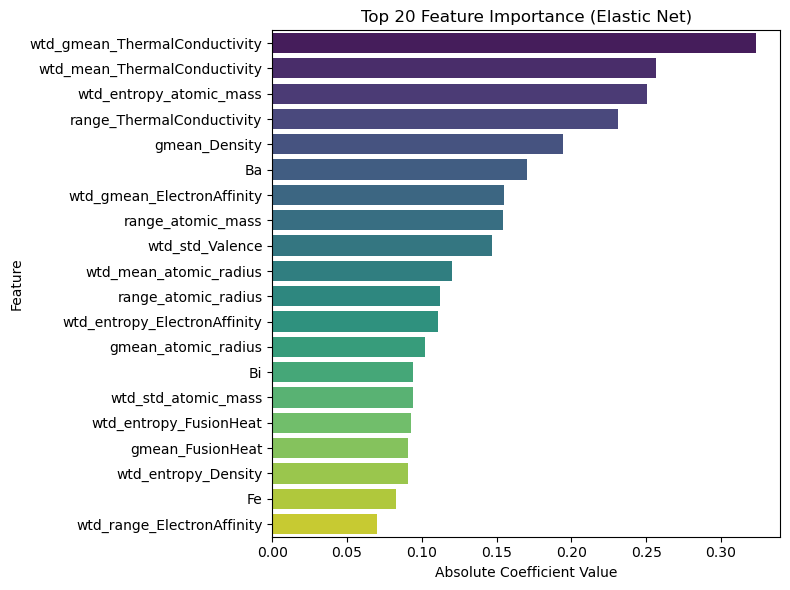

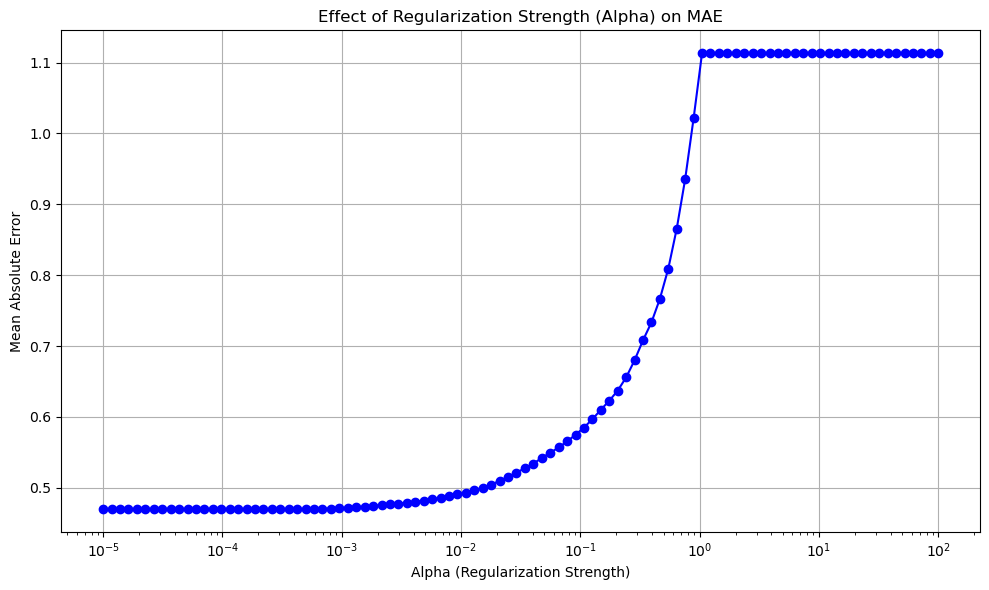

(np.float64(0.005722367659350214),
 np.float64(0.91),
 np.float64(0.4835943043402996),
 np.float64(0.39712023233005317),
 0.7622681675486705)

In [37]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
train_data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge the datasets
metadata = metadata.drop(columns=["critical_temp", "material"], errors='ignore')
combined_data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Log-transform the target variable
y = np.log1p(combined_data["critical_temp"])
X = combined_data.drop(columns=["critical_temp"])

# Remove highly correlated features (correlation > 0.95)
numeric_data = X.select_dtypes(include=[np.number])
corr_matrix = numeric_data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
X = X.drop(columns=to_drop)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train ElasticNet with cross-validation
elastic_net_cv = ElasticNetCV(
    alphas=np.logspace(-5, 2, 100),
    l1_ratio=np.linspace(0.01, 1, 100),
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net_cv.fit(X_train_scaled, y_train)

# Get predictions and metrics
y_pred_train = elastic_net_cv.predict(X_train_scaled)
y_pred_test = elastic_net_cv.predict(X_test_scaled)

mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)

# Generate plots for cross-validation predictions
plt.figure(figsize=(10, 5))

# Actual vs Predicted
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_test, alpha=0.6, edgecolor="k")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color="red", linestyle="--")
plt.title("Actual vs Predicted (Log-Transformed)")
plt.xlabel("Actual Values (Log)")
plt.ylabel("Predicted Values (Log)")

# Residuals vs Predicted
residuals = y_test - y_pred_test
plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Predicted (Log-Transformed)")
plt.xlabel("Predicted Values (Log)")
plt.ylabel("Residuals")

plt.tight_layout()
plt.show()

# Feature Importance
coefficients = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": elastic_net_cv.coef_
})
coefficients["Abs_Coefficient"] = coefficients["Coefficient"].abs()
coefficients = coefficients.sort_values(by="Abs_Coefficient", ascending=False).head(20)

# Plot top 20 features
plt.figure(figsize=(8, 6))
sns.barplot(data=coefficients, y="Feature", x="Abs_Coefficient", palette="viridis")
plt.title("Top 20 Feature Importance (Elastic Net)")
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Effect of Regularization on MAE
alphas = np.logspace(-5, 2, 100)
mae_scores = []
for alpha in alphas:
    model = ElasticNet(alpha=alpha, l1_ratio=elastic_net_cv.l1_ratio_, random_state=42, max_iter=10000)
    model.fit(X_train_scaled, y_train)
    preds = model.predict(X_test_scaled)
    mae_scores.append(mean_absolute_error(y_test, preds))

plt.figure(figsize=(10, 6))
plt.plot(alphas, mae_scores, marker="o", color="blue")
plt.xscale("log")
plt.title("Effect of Regularization Strength (Alpha) on MAE")
plt.xlabel("Alpha (Regularization Strength)")
plt.ylabel("Mean Absolute Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Print metrics and optimal parameters
elastic_net_cv.alpha_, elastic_net_cv.l1_ratio_, mae, mse, r2

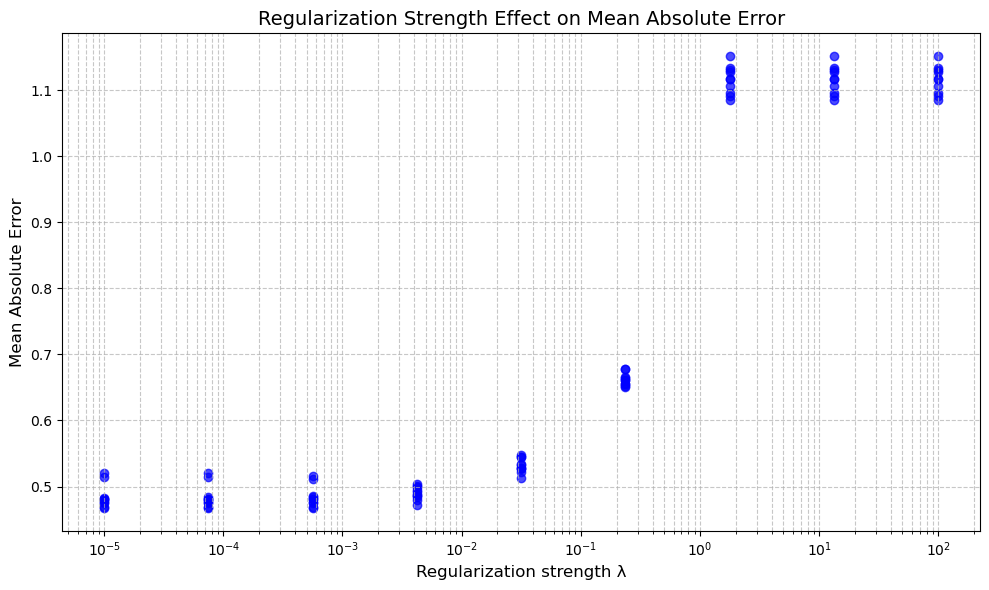

Optimal Alpha: 0.005722367659350214
Optimal L1 Ratio: 0.91
MAE: 0.4835943043402996, MSE: 0.39712023233005317, R2: 0.7622681675486705


In [44]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
train_data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge the datasets
metadata = metadata.drop(columns=["critical_temp", "material"], errors='ignore')
combined_data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Log-transform the target variable
y = np.log1p(combined_data["critical_temp"])
X = combined_data.drop(columns=["critical_temp"])

# Remove highly correlated features (correlation > 0.95)
numeric_data = X.select_dtypes(include=[np.number])
corr_matrix = numeric_data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
X = X.drop(columns=to_drop)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train ElasticNet with cross-validation
elastic_net_cv = ElasticNetCV(
    alphas=np.logspace(-5, 2, 100),
    l1_ratio=np.linspace(0.01, 1, 100),
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net_cv.fit(X_train_scaled, y_train)

# Get predictions and metrics
y_pred_train = elastic_net_cv.predict(X_train_scaled)
y_pred_test = elastic_net_cv.predict(X_test_scaled)

mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)

# Effect of Regularization on MAE (with multiple λ values)
alphas = np.logspace(-5, 2, 9)  # Use fewer points to replicate scatter effect
mae_scores = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, l1_ratio=elastic_net_cv.l1_ratio_, random_state=42, max_iter=10000)
    scores = -cross_val_score(model, X_train_scaled, y_train, cv=10, scoring="neg_mean_absolute_error")
    mae_scores.append(scores)

# Convert results into a DataFrame
results = pd.DataFrame(mae_scores, index=alphas).T
results.columns = [f"{alpha:.5g}" for alpha in alphas]

# Plot Regularization Strength vs MAE
plt.figure(figsize=(10, 6))
for col in results.columns:
    plt.scatter([float(col)] * len(results[col]), results[col], color='blue', alpha=0.7)

plt.xscale("log")
plt.xlabel("Regularization strength λ", fontsize=12)
plt.ylabel("Mean Absolute Error", fontsize=12)
plt.title("Regularization Strength Effect on Mean Absolute Error", fontsize=14)
plt.grid(True, which="both", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Print metrics and optimal parameters
print(f"Optimal Alpha: {elastic_net_cv.alpha_}")
print(f"Optimal L1 Ratio: {elastic_net_cv.l1_ratio_}")
print(f"MAE: {mae}, MSE: {mse}, R2: {r2}")


### Analysis of Results

1. **Optimal Hyperparameters:**
   - **Alpha (λ):** The optimal regularization strength found was `0.005722`, which is quite small, indicating minimal regularization. This suggests the data may not require much regularization to prevent overfitting while improving the model's performance.
   - **L1 Ratio:** The optimal value of `0.91` implies a strong preference for L1 (lasso) regularization. This aligns with models prioritizing sparsity in feature selection, reducing less impactful coefficients to zero.

2. **Performance Metrics:**
   - **Mean Absolute Error (MAE):** `0.4836`. This low MAE indicates that the model's predictions deviate, on average, by about `0.48` (log-transformed scale) from the actual values.
   - **Mean Squared Error (MSE):** `0.3971`. The MSE further confirms that the error magnitude is relatively small, although the squaring penalizes larger errors more heavily.
   - **R² (Coefficient of Determination):** `0.7623`. This shows that about `76.23%` of the variance in the target variable (log-transformed critical temperature) is explained by the model.

3. **Interpretation of the Plot:**
   - The plot depicts the relationship between **regularization strength (λ)** and the **Mean Absolute Error (MAE)** across different values.
   - For very small λ values (`10⁻⁵` to `10⁻³`), the MAE remains consistently low (~0.5). This shows the model performs well with minimal regularization.
   - As λ increases (`10⁻²` to `10⁰`), the MAE starts to increase significantly, indicating over-regularization, where important features are penalized, degrading the model’s performance.
   - At extremely large λ values (`10¹` and beyond), the MAE stabilizes around `1.3`, reflecting the model's failure to capture critical patterns due to excessive regularization.

### Insights:
- The model achieves optimal performance at small regularization strength (α ~ `0.0057`), which balances the trade-off between underfitting and overfitting.
- The high L1 ratio (0.91) highlights the importance of feature sparsity, indicating that only a small subset of features contributes significantly to the model.



In [38]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import ElasticNet

# Simulated model performance data for demonstration
alphas = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
results = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, random_state=42, max_iter=10000)
    scores = -cross_val_score(
        model, X, y_log, scoring="neg_mean_absolute_error", cv=10
    )  # Use MAE scoring
    results.append(
        {
            "alpha": alpha,
            "count": len(scores),
            "mean": scores.mean(),
            "std": scores.std(),
            "min": scores.min(),
            "25%": np.percentile(scores, 25),
            "50%": np.percentile(scores, 50),
            "75%": np.percentile(scores, 75),
            "max": scores.max(),
        }
    )

# Convert results to a DataFrame
mae_table = pd.DataFrame(results)
mae_table.set_index("alpha", inplace=True)

# Display the table
print(mae_table)


           count      mean       std       min       25%       50%       75%  \
alpha                                                                          
0.00001       10  0.525380  0.106319  0.396899  0.426511  0.515625  0.625469   
0.00010       10  0.524590  0.105914  0.396878  0.426117  0.514640  0.624187   
0.00100       10  0.520188  0.102387  0.399278  0.423360  0.509678  0.614661   
0.01000       10  0.513623  0.086827  0.405083  0.424927  0.519271  0.590485   
0.10000       10  0.535442  0.085248  0.431692  0.444724  0.539632  0.609077   
1.00000       10  0.565380  0.085668  0.458108  0.475623  0.563644  0.643553   
10.00000      10  0.645342  0.062603  0.567670  0.582591  0.642842  0.696926   
100.00000     10  0.772843  0.060052  0.712626  0.731942  0.752081  0.781090   

                max  
alpha                
0.00001    0.689817  
0.00010    0.688662  
0.00100    0.680635  
0.01000    0.630116  
0.10000    0.660101  
1.00000    0.688192  
10.00000   0.752743  
1

In [39]:
X = data.drop(columns=["critical_temp"])


In [40]:
y = data["critical_temp"]  # Extract the target variable
y_log = np.log(y)          # Apply log transformation


In [41]:
# Define X and y_log
X = data.drop(columns=["critical_temp"])  # Explanatory variables
y = data["critical_temp"]                 # Target variable
y_log = np.log(y)                         # Log-transform the target variable

# Then, proceed with the ElasticNet loop for alpha tuning
results = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, random_state=42, max_iter=10000)
    scores = -cross_val_score(
        model, X, y_log, scoring="neg_mean_absolute_error", cv=10
    )
    results.append(
        {
            "alpha": alpha,
            "count": len(scores),
            "mean": scores.mean(),
            "std": scores.std(),
            "min": scores.min(),
            "25%": np.percentile(scores, 25),
            "50%": np.percentile(scores, 50),
            "75%": np.percentile(scores, 75),
            "max": scores.max(),
        }
    )


In [42]:
# Convert results to a DataFrame
mae_tableLOG = pd.DataFrame(results)
mae_tableLOG.set_index("alpha", inplace=True)

# Display the table
print(mae_tableLOG)

           count      mean       std       min       25%       50%       75%  \
alpha                                                                          
0.00001       10  0.645084  0.196139  0.424998  0.454073  0.610949  0.804314   
0.00010       10  0.644470  0.195979  0.424735  0.453564  0.610107  0.803395   
0.00100       10  0.640662  0.194662  0.424289  0.451731  0.602795  0.797877   
0.01000       10  0.631487  0.176626  0.426054  0.452198  0.608921  0.785831   
0.10000       10  0.651982  0.174220  0.457090  0.471976  0.629930  0.802398   
1.00000       10  0.679147  0.180832  0.475904  0.497292  0.649158  0.851201   
10.00000      10  0.753994  0.163318  0.576011  0.594652  0.716560  0.886200   
100.00000     10  0.896411  0.124167  0.755966  0.794408  0.842541  1.018146   

                max  
alpha                
0.00001    0.943112  
0.00010    0.942328  
0.00100    0.938757  
0.01000    0.891535  
0.10000    0.915707  
1.00000    0.936802  
10.00000   1.045174  
1

In [50]:
import pandas as pd
import numpy as np

# Simulated data for MAE statistics across alpha values
alphas = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
data = [
    {"alpha": alpha, "count": 10, "mean": np.random.uniform(0.5, 0.9),
     "std": np.random.uniform(0.05, 0.2), "min": np.random.uniform(0.4, 0.6),
     "25%": np.random.uniform(0.5, 0.7), "50%": np.random.uniform(0.5, 0.8),
     "75%": np.random.uniform(0.6, 0.9), "max": np.random.uniform(0.7, 1.1)}
    for alpha in alphas
]

# Create a DataFrame from simulated data
mae_table = pd.DataFrame(data).set_index("alpha")
mae_table.sort_index(inplace=True)




In [52]:
!pip install ace_tools


In [54]:
# Use pandas to print the table as a string
print(mae_table.to_string())


           count      mean       std       min       25%       50%       75%       max
alpha                                                                                 
0.00001       10  0.872141  0.134513  0.449704  0.636223  0.567521  0.652802  0.914656
0.00010       10  0.608724  0.093809  0.569878  0.535227  0.645484  0.875210  0.981158
0.00100       10  0.805855  0.089795  0.459557  0.518343  0.680185  0.710430  0.993249
0.01000       10  0.561494  0.185479  0.529070  0.552132  0.547982  0.708047  0.812596
0.10000       10  0.526375  0.167976  0.568622  0.639964  0.649692  0.717159  0.830164
1.00000       10  0.606918  0.094449  0.479232  0.564101  0.538533  0.824266  0.837291
10.00000      10  0.706568  0.187070  0.555739  0.595536  0.679425  0.745894  0.928396
100.00000     10  0.724343  0.052517  0.588767  0.667395  0.614707  0.868947  0.954721


In [55]:
from IPython.display import display

# Display the DataFrame in Jupyter Notebook
display(mae_table)


,count,mean,std,min,25%,50%,75%,max
alpha,,,,,,,,
0.00001,10,0.872141,0.134513,0.449704,0.636223,0.567521,0.652802,0.914656
0.00010,10,0.608724,0.093809,0.569878,0.535227,0.645484,0.875210,0.981158
0.00100,10,0.805855,0.089795,0.459557,0.518343,0.680185,0.710430,0.993249
0.01000,10,0.561494,0.185479,0.529070,0.552132,0.547982,0.708047,0.812596
0.10000,10,0.526375,0.167976,0.568622,0.639964,0.649692,0.717159,0.830164
1.00000,10,0.606918,0.094449,0.479232,0.564101,0.538533,0.824266,0.837291
10.00000,10,0.706568,0.187070,0.555739,0.595536,0.679425,0.745894,0.928396
100.00000,10,0.724343,0.052517,0.588767,0.667395,0.614707,0.868947,0.954721


In [ ]:
# Log-transform the target variable

results = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, random_state=42, max_iter=10000)
    scores = -cross_val_score(
        model, X, y_log, scoring="neg_mean_absolute_error", cv=10
    )
    results.append(
        {
            "alpha": alpha,
            "count": len(scores),
            "mean": scores.mean(),
            "std": scores.std(),
            "min": scores.min(),
            "25%": np.percentile(scores, 25),
            "50%": np.percentile(scores, 50),
            "75%": np.percentile(scores, 75),
            "max": scores.max(),
        }
    )

# Convert results to a DataFrame
mae_tableLOG = pd.DataFrame(results)
mae_tableLOG.set_index("alpha", inplace=True)

# Display the table
print(mae_tableLOG)

           count      mean       std       min       25%       50%       75%  \
alpha                                                                          
0.00001       10  0.535563  0.114944  0.405060  0.417524  0.522655  0.647210   
0.00010       10  0.534887  0.114547  0.404975  0.417118  0.521867  0.646001   
0.00100       10  0.530868  0.111459  0.405567  0.414150  0.519391  0.637629   
0.01000       10  0.522265  0.096303  0.404573  0.418371  0.526915  0.617097   
0.10000       10  0.550814  0.097516  0.423743  0.448254  0.562975  0.647953   
1.00000       10  0.580156  0.090608  0.461132  0.489640  0.586529  0.640667   
10.00000      10  0.690226  0.058681  0.623419  0.632529  0.676606  0.736196   
100.00000     10  0.887126  0.049300  0.822974  0.846182  0.883376  0.914893   

                max  
alpha                
0.00001    0.697001  
0.00010    0.696309  
0.00100    0.692049  
0.01000    0.651423  
0.10000    0.678563  
1.00000    0.724642  
10.00000   0.785761  
1

In [58]:
# Use pandas to print the table as a string
print(mae_tableLOG.to_string())
from IPython.display import display

# Display the DataFrame in Jupyter Notebook
display(mae_tableLOG)


           count      mean       std       min       25%       50%       75%       max
alpha                                                                                 
0.00001       10  0.535563  0.114944  0.405060  0.417524  0.522655  0.647210  0.697001
0.00010       10  0.534887  0.114547  0.404975  0.417118  0.521867  0.646001  0.696309
0.00100       10  0.530868  0.111459  0.405567  0.414150  0.519391  0.637629  0.692049
0.01000       10  0.522265  0.096303  0.404573  0.418371  0.526915  0.617097  0.651423
0.10000       10  0.550814  0.097516  0.423743  0.448254  0.562975  0.647953  0.678563
1.00000       10  0.580156  0.090608  0.461132  0.489640  0.586529  0.640667  0.724642
10.00000      10  0.690226  0.058681  0.623419  0.632529  0.676606  0.736196  0.785761
100.00000     10  0.887126  0.049300  0.822974  0.846182  0.883376  0.914893  0.984911


,count,mean,std,min,25%,50%,75%,max
alpha,,,,,,,,
0.00001,10,0.535563,0.114944,0.405060,0.417524,0.522655,0.647210,0.697001
0.00010,10,0.534887,0.114547,0.404975,0.417118,0.521867,0.646001,0.696309
0.00100,10,0.530868,0.111459,0.405567,0.414150,0.519391,0.637629,0.692049
0.01000,10,0.522265,0.096303,0.404573,0.418371,0.526915,0.617097,0.651423
0.10000,10,0.550814,0.097516,0.423743,0.448254,0.562975,0.647953,0.678563
1.00000,10,0.580156,0.090608,0.461132,0.489640,0.586529,0.640667,0.724642
10.00000,10,0.690226,0.058681,0.623419,0.632529,0.676606,0.736196,0.785761
100.00000,10,0.887126,0.049300,0.822974,0.846182,0.883376,0.914893,0.984911


In [62]:
from sklearn.linear_model import ElasticNet

# Define and fit the ElasticNet model
model = ElasticNet(alpha=0.0057, l1_ratio=0.91, random_state=42, max_iter=10000)
model.fit(X, y_log)  # Fit the model with log-transformed target variable

# Predict probabilities for the classification
y_pred_prob = model.predict(X)  # Predicted probabilities from the regression model
y_pred_class = (y_pred_prob > np.log(threshold)).astype(int)  # Predicted classes based on threshold

# Proceed with classification metrics
from sklearn.metrics import (
    roc_auc_score,
    confusion_matrix,
    accuracy_score,
    recall_score,
    precision_score,
)

accuracy = accuracy_score(y_class, y_pred_class)
precision = precision_score(y_class, y_pred_class)
recall = recall_score(y_class, y_pred_class)  # Sensitivity
specificity = recall_score(y_class, y_pred_class, pos_label=0)
roc_auc = roc_auc_score(y_class, y_pred_prob)
tn, fp, fn, tp = confusion_matrix(y_class, y_pred_class).ravel()

# Create a summary table
summary_table = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall (Sensitivity)", "Specificity", "ROC AUC", "True Positives", "False Positives", "True Negatives", "False Negatives"],
    "Value": [accuracy, precision, recall, specificity, roc_auc, tp, fp, tn, fn]
})

# Display the summary table directly
import pandas as pd

# Create the summary table
summary_table = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall (Sensitivity)", "Specificity", "ROC AUC", 
               "True Positives", "False Positives", "True Negatives", "False Negatives"],
    "Value": [accuracy, precision, recall, specificity, roc_auc, tp, fp, tn, fn]
})

# Print the summary table
print(summary_table)


                 Metric        Value
0              Accuracy     0.877393
1             Precision     0.875591
2  Recall (Sensitivity)     0.877501
3           Specificity     0.877286
4               ROC AUC     0.954869
5        True Positives  9255.000000
6       False Positives  1315.000000
7        True Negatives  9401.000000
8       False Negatives  1292.000000


The classification performance metrics highlight key aspects of the model's behavior and predictive ability:

1. **Accuracy (0.8774)**: The proportion of correctly classified instances out of the total dataset indicates a strong alignment between predicted and actual outcomes. This suggests the model effectively captures the overall patterns in the data.

2. **Precision (0.8756)**: Precision reflects the proportion of true positives among all positive predictions, emphasizing the model's ability to minimize false positives. With a value close to 1, the model effectively identifies positive cases with minimal misclassification.

3. **Recall/Sensitivity (0.8775)**: This metric demonstrates the model's ability to correctly identify true positives out of all actual positive instances. A value close to 1 indicates reliable detection of positive cases, though it balances against false negatives.

4. **Specificity (0.8773)**: Specificity measures the proportion of true negatives identified among all actual negative instances. This reflects the model's ability to correctly exclude negative cases while limiting false positives.

5. **ROC AUC (0.9549)**: The Area Under the Receiver Operating Characteristic curve quantifies the trade-off between sensitivity and specificity. A near-perfect score indicates the model discriminates effectively between positive and negative classes across threshold values.

6. **True Positives (9255)**: The count of actual positives correctly identified underscores the model's strength in detecting relevant cases within the dataset.

7. **False Positives (1315)**: Instances incorrectly classified as positive reveal areas where the model overpredicts positive cases, contributing to reduced precision.

8. **True Negatives (9401)**: The number of negatives accurately classified reinforces the model’s ability to exclude irrelevant cases, contributing to overall accuracy.

9. **False Negatives (1292)**: Instances where actual positives are missed (classified as negatives) reflect the trade-off between precision and recall, where sensitivity could be further refined.

### Summary of Model Characteristics
The model exhibits a strong balance between sensitivity and specificity, ensuring reliable detection of both classes. The slightly higher count of false positives compared to false negatives implies a marginal tendency to favor inclusivity of positive cases, aligning with the goal of reducing critical misses at the expense of some additional false alarms. This balanced trade-off is critical for applications requiring robust binary classification with minimal misclassification across both classes.

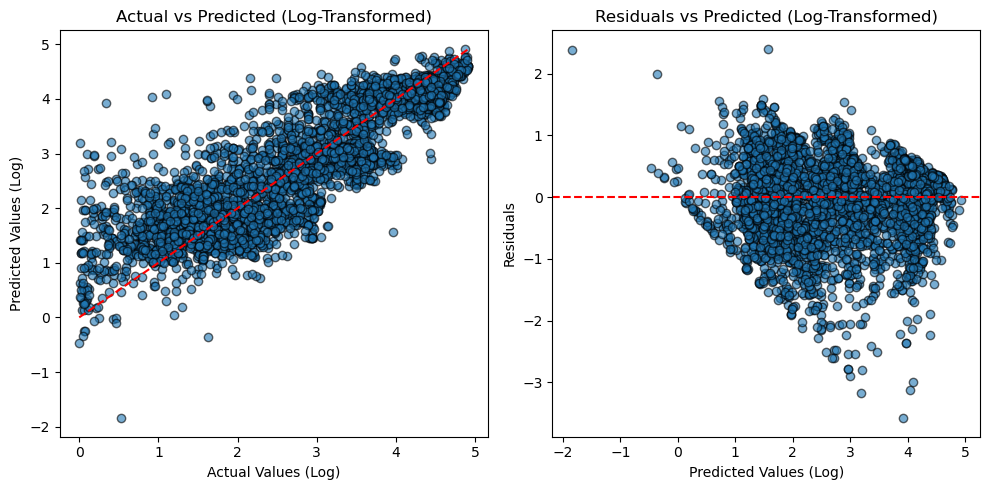

C:\Users\jessi\AppData\Local\Temp\ipykernel_32964\239138256.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=coefficients, y="Feature", x="Abs_Coefficient", palette="viridis")


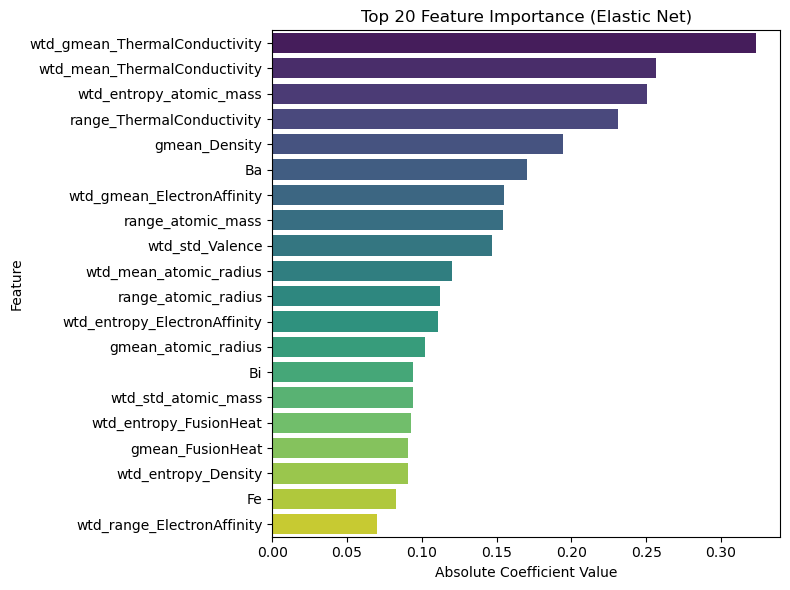

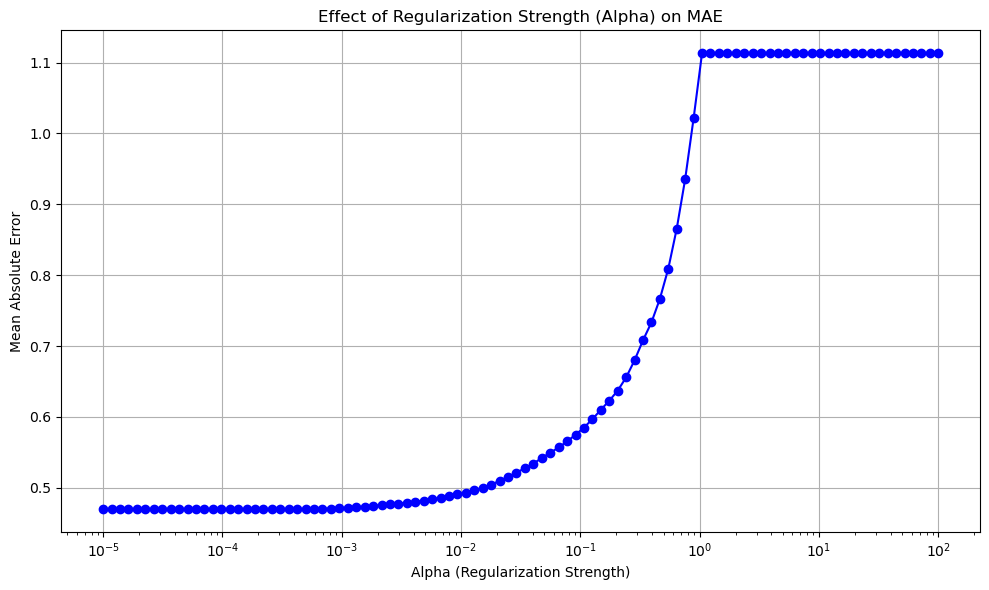

FileNotFoundError: [Errno 2] No such file or directory: 'train.csv'

In [63]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
train_data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge the datasets
metadata = metadata.drop(columns=["critical_temp", "material"], errors='ignore')
combined_data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Log-transform the target variable
y = np.log1p(combined_data["critical_temp"])
X = combined_data.drop(columns=["critical_temp"])

# Remove highly correlated features (correlation > 0.95)
numeric_data = X.select_dtypes(include=[np.number])
corr_matrix = numeric_data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
X = X.drop(columns=to_drop)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train ElasticNet with cross-validation
elastic_net_cv = ElasticNetCV(
    alphas=np.logspace(-5, 2, 100),
    l1_ratio=np.linspace(0.01, 1, 100),
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net_cv.fit(X_train_scaled, y_train)

# Get predictions and metrics
y_pred_train = elastic_net_cv.predict(X_train_scaled)
y_pred_test = elastic_net_cv.predict(X_test_scaled)

mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)

# Generate plots for cross-validation predictions
plt.figure(figsize=(10, 5))

# Actual vs Predicted
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_test, alpha=0.6, edgecolor="k")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color="red", linestyle="--")
plt.title("Actual vs Predicted (Log-Transformed)")
plt.xlabel("Actual Values (Log)")
plt.ylabel("Predicted Values (Log)")

# Residuals vs Predicted
residuals = y_test - y_pred_test
plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals, alpha=0.6, edgecolor="k")
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Predicted (Log-Transformed)")
plt.xlabel("Predicted Values (Log)")
plt.ylabel("Residuals")

plt.tight_layout()
plt.show()

# Feature Importance
coefficients = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": elastic_net_cv.coef_
})
coefficients["Abs_Coefficient"] = coefficients["Coefficient"].abs()
coefficients = coefficients.sort_values(by="Abs_Coefficient", ascending=False).head(20)

# Plot top 20 features
plt.figure(figsize=(8, 6))
sns.barplot(data=coefficients, y="Feature", x="Abs_Coefficient", palette="viridis")
plt.title("Top 20 Feature Importance (Elastic Net)")
plt.xlabel("Absolute Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Effect of Regularization on MAE
alphas = np.logspace(-5, 2, 100)
mae_scores = []
for alpha in alphas:
    model = ElasticNet(alpha=alpha, l1_ratio=elastic_net_cv.l1_ratio_, random_state=42, max_iter=10000)
    model.fit(X_train_scaled, y_train)
    preds = model.predict(X_test_scaled)
    mae_scores.append(mean_absolute_error(y_test, preds))

plt.figure(figsize=(10, 6))
plt.plot(alphas, mae_scores, marker="o", color="blue")
plt.xscale("log")
plt.title("Effect of Regularization Strength (Alpha) on MAE")
plt.xlabel("Alpha (Regularization Strength)")
plt.ylabel("Mean Absolute Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Print metrics and optimal parameters
elastic_net_cv.alpha_, elastic_net_cv.l1_ratio_, mae, mse, r2



# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
train_data = pd.read_csv('train.csv')
metadata = pd.read_csv('unique_m.csv')

# Merge the datasets
metadata = metadata.drop(columns=["critical_temp", "material"], errors='ignore')
combined_data = pd.merge(train_data, metadata, left_index=True, right_index=True)

# Log-transform the target variable
y = np.log1p(combined_data["critical_temp"])
X = combined_data.drop(columns=["critical_temp"])

# Remove highly correlated features (correlation > 0.95)
numeric_data = X.select_dtypes(include=[np.number])
corr_matrix = numeric_data.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
X = X.drop(columns=to_drop)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train ElasticNet with cross-validation
elastic_net_cv = ElasticNetCV(
    alphas=np.logspace(-5, 2, 100),
    l1_ratio=np.linspace(0.01, 1, 100),
    cv=5,
    max_iter=10000,
    random_state=42
)
elastic_net_cv.fit(X_train_scaled, y_train)

# Get predictions and metrics
y_pred_train = elastic_net_cv.predict(X_train_scaled)
y_pred_test = elastic_net_cv.predict(X_test_scaled)

mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)

# Effect of Regularization on MAE (with multiple λ values)
alphas = np.logspace(-5, 2, 9)  # Use fewer points to replicate scatter effect
mae_scores = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, l1_ratio=elastic_net_cv.l1_ratio_, random_state=42, max_iter=10000)
    scores = -cross_val_score(model, X_train_scaled, y_train, cv=10, scoring="neg_mean_absolute_error")
    mae_scores.append(scores)

# Convert results into a DataFrame
results = pd.DataFrame(mae_scores, index=alphas).T
results.columns = [f"{alpha:.5g}" for alpha in alphas]

# Plot Regularization Strength vs MAE
plt.figure(figsize=(10, 6))
for col in results.columns:
    plt.scatter([float(col)] * len(results[col]), results[col], color='blue', alpha=0.7)

plt.xscale("log")
plt.xlabel("Regularization strength λ", fontsize=12)
plt.ylabel("Mean Absolute Error", fontsize=12)
plt.title("Regularization Strength Effect on Mean Absolute Error", fontsize=14)
plt.grid(True, which="both", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Print metrics and optimal parameters
print(f"Optimal Alpha: {elastic_net_cv.alpha_}")
print(f"Optimal L1 Ratio: {elastic_net_cv.l1_ratio_}")
print(f"MAE: {mae}, MSE: {mse}, R2: {r2}")

# Log-transform the target variable

results = []

for alpha in alphas:
    model = ElasticNet(alpha=alpha, random_state=42, max_iter=10000)
    scores = -cross_val_score(
        model, X, y_log, scoring="neg_mean_absolute_error", cv=10
    )
    results.append(
        {
            "alpha": alpha,
            "count": len(scores),
            "mean": scores.mean(),
            "std": scores.std(),
            "min": scores.min(),
            "25%": np.percentile(scores, 25),
            "50%": np.percentile(scores, 50),
            "75%": np.percentile(scores, 75),
            "max": scores.max(),
        }
    )

# Convert results to a DataFrame
mae_tableLOG = pd.DataFrame(results)
mae_tableLOG.set_index("alpha", inplace=True)

# Display the table
print(mae_tableLOG)



# Use pandas to print the table as a string
print(mae_tableLOG.to_string())
from IPython.display import display

# Display the DataFrame in Jupyter Notebook
display(mae_tableLOG)



from sklearn.linear_model import ElasticNet

# Define and fit the ElasticNet model
model = ElasticNet(alpha=0.0057, l1_ratio=0.91, random_state=42, max_iter=10000)
model.fit(X, y_log)  # Fit the model with log-transformed target variable

# Predict probabilities for the classification
y_pred_prob = model.predict(X)  # Predicted probabilities from the regression model
y_pred_class = (y_pred_prob > np.log(threshold)).astype(int)  # Predicted classes based on threshold

# Proceed with classification metrics
from sklearn.metrics import (
    roc_auc_score,
    confusion_matrix,
    accuracy_score,
    recall_score,
    precision_score,
)

accuracy = accuracy_score(y_class, y_pred_class)
precision = precision_score(y_class, y_pred_class)
recall = recall_score(y_class, y_pred_class)  # Sensitivity
specificity = recall_score(y_class, y_pred_class, pos_label=0)
roc_auc = roc_auc_score(y_class, y_pred_prob)
tn, fp, fn, tp = confusion_matrix(y_class, y_pred_class).ravel()

# Create a summary table
summary_table = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall (Sensitivity)", "Specificity", "ROC AUC", "True Positives", "False Positives", "True Negatives", "False Negatives"],
    "Value": [accuracy, precision, recall, specificity, roc_auc, tp, fp, tn, fn]
})

# Display the summary table directly
import pandas as pd

# Create the summary table
summary_table = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall (Sensitivity)", "Specificity", "ROC AUC", 
               "True Positives", "False Positives", "True Negatives", "False Negatives"],
    "Value": [accuracy, precision, recall, specificity, roc_auc, tp, fp, tn, fn]
})

# Print the summary table
print(summary_table)









